# Edge Detection Using Canny

# Libraries Import


In [39]:
import numpy as np
from scipy import ndimage
import cv2
from matplotlib import pyplot as plt

# Data processing
import os
import math
import shutil
import pandas as pd
import numpy as np
#import pydicom
from dicompylercore import dicomparser, dvh, dvhcalc
import cv2
from skimage import io
from scipy import ndimage
from torchvision import datasets, transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.utils import make_grid

from skimage import morphology
from skimage import measure
from skimage.transform import resize
from skimage import metrics
from sklearn.cluster import KMeans
from scipy import spatial 

# Dicom Processing and Segmentation

## Get middle slice
Get middle slice along with the corresponding information provided by the DICOM file.

In [188]:
def load_mid_slices(import_path):
    slices=[] #save midslices
    list_of_filepaths=[] #save file paths
    # Walk through the defined import path (i.e. loops over all files contained in the different subfolders)
    for root, dirs, files in os.walk(import_path, topdown=False):

        # Only keep 3D CT scans (i.e. scans that have at least 10 slices)
        if len(files) > 10:

            # Calculate total number of slices for current file
            total_slices = len(files)

            # Calculate middle slice index
            mid_slice = int(total_slices/2)

            # Define filename for middle slice
            filepath= os.path.join(root, files[mid_slice])

            # Read middle slice (DICOM file)
            dp = dicomparser.DicomParser(filepath)
            slices.append(dp)
            
            list_of_filepaths.append(filepath)

    return slices, list_of_filepaths 

In [189]:
def normalize_scans(scans): 
    image = scans.GetImage(window=1000, level=-750) #normalize dicom image by getting proper contrast between lungs and everything else
    image = np.array(image.getdata()).reshape(512,512)
    
    #convert to int16
    image= image.astype(np.int16) 
    
    image[image == -2000] = 0 
     
    return np.array(image, dtype=np.int16) 

## Segmentation
- Standardize the pixel value by subtracting the mean and dividing by the standard deviation
- Identify threshold by creating 2 KMeans clusters comparing centers of soft tissue/bone vs lung/air.
- Use Erosion and Dilation to remove tiny features like pulmonary vessels or noise
- Identify each distinct region as different image labels
- Use bounding boxes and labels to identify the lung areas
- Create the masks for lung fields with the correct bounding boxes.
- Apply mask onto the original image

In [190]:

def make_lungmask(img):
    row_size= img.shape[0]
    col_size = img.shape[1]
    #Standardize the pixel values
    mean = np.mean(img)
    std = np.std(img)
    img = img-mean
    img = img/std
    # Find the average pixel value near the lungs
    middle = img[int(col_size/5):int(col_size/5*4),int(row_size/5):int(row_size/5*4)] 
    mean = np.mean(middle)  
    max = np.max(img)
    min = np.min(img)
    img[img==max]=mean
    img[img==min]=mean
    
    # Use Kmeans to separate soft tissue/bone from background 
    kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
    centers = sorted(kmeans.cluster_centers_.flatten())
    threshold = np.mean(centers)
    thresh_img = np.where(img<threshold,1.0,0.0)  # threshold the image

    # Erode away the finer elements and dilate to include some of the pixels surrounding the lung.  
    eroded = morphology.erosion(thresh_img,np.ones([3,3]))
    dilation = morphology.dilation(eroded,np.ones([8,8]))
    
    #Labeled array, where all connected regions are assigned the same integer value
    labels = measure.label(dilation) # Different labels are displayed in different colors
    label_vals = np.unique(labels)
    #Measure properties of labeled image regions.
    regions = measure.regionprops(labels)

    good_labels = [] #store good labels here (what we identify as lungs based on bounding box location)
    
    #plot to show bounding boxes (just for testing)
    fig, ax = plt.subplots()
    ax.imshow(labels, cmap=plt.cm.gray)
    
    #for each different region
    for prop in regions:
        B = prop.bbox #Bounding box of region (min_row, min_col, max_row, max_col).
        area=prop.bbox_area
        minr, minc, maxr, maxc = B
        #print(area) #just for testing- to determine how big lungs are on average
        
        #if statement saying good regions (lungs) are between a certain area with edges located between certain rows and columns
        #got these values from experimentation. Might have to change to incorporate larger dataset, depending on where lungs 
        #are located and where artifacts are
        if (area > 10000 and area < 170000 and minr > (row_size*60/512) and maxr < (row_size*490/512) and maxc < (col_size*500/512) and minc > (col_size*12/512)):
            good_labels.append(prop.label)
        
        #show bounding box edges as blue on image (just for testing)
        bx = (minc, maxc, maxc, minc, minc)
        by = (minr, minr, maxr, maxr, minr)
        good_regions= ax.plot(bx, by, '-b', linewidth=2.5)
   
    plt.show()
    #create a black mask the same size as image
    mask = np.ndarray([row_size,col_size],dtype=np.int8)
    mask[:] = 0
    
    for N in good_labels:
        mask = mask + np.where(labels==N,1,0) #set good label areas (lungs) to white
        
    mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation once only lungs remain

    return thresh_img, dilation, labels, mask, mask*img

# Function Calls for 1 slice

Set mid_slice_index value to see one image with its mask

**************************************************************
***************************************************************


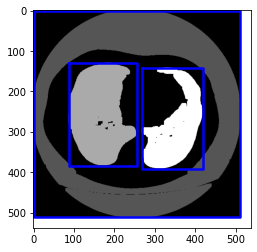

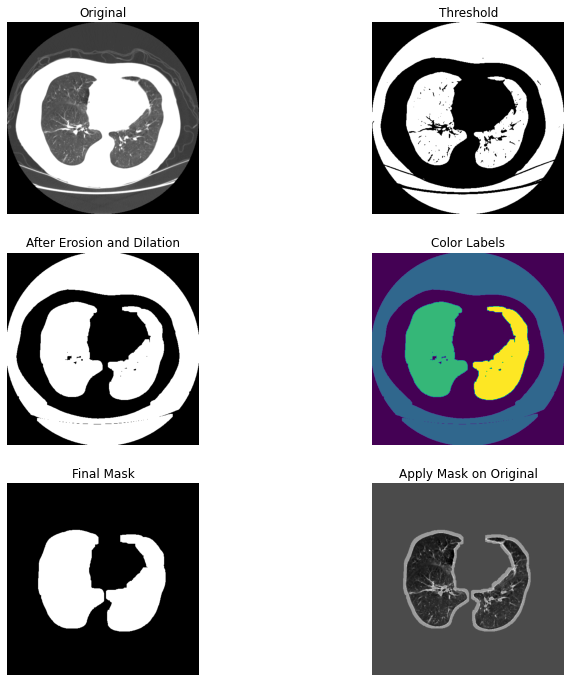

In [191]:
mid_slice_index= 0
saving_filename= [] #variable holding name of the masks generated
# Define paths path 
importing_path = r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Data\Original' #location of original dicom files
outputting_path= r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\edge_output_path' 
#Define paths to save masks and subplots
saving_subplots_path=r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Jupyter subplots'
saving_masks_path=r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Jupyter masks'

mid_slices, list_of_filenames= load_mid_slices(importing_path) #get slices and file path names, and pass these into normalize_scans as scans 

for x in range(51): #0 to 50
    saving_filename.append(list_of_filenames[x].split('\\')[9] + '.jpg') #split entire directory and get 9th index (just the LIDC-IDRI-0XXX part)


imgs = normalize_scans(mid_slices[mid_slice_index]) 
np.save(outputting_path + "fullimages.npy", imgs)

print('**************************************************************')

imgs_to_process = np.load(outputting_path+'fullimages.npy')

print('***************************************************************')
plot_thresh_img, plot_dilation, plot_labels, plot_mask, plot_apply_mask= make_lungmask(imgs_to_process)

#plot processed images
fig, ax = plt.subplots(3, 2, figsize=[12, 12])
ax[0, 0].set_title("Original")
ax[0, 0].imshow(imgs_to_process, cmap='gray')
ax[0, 0].axis('off')
ax[0, 1].set_title("Threshold")
ax[0, 1].imshow(plot_thresh_img, cmap='gray')
ax[0, 1].axis('off')
ax[1, 0].set_title("After Erosion and Dilation")
ax[1, 0].imshow(plot_dilation, cmap='gray')
ax[1, 0].axis('off')
ax[1, 1].set_title("Color Labels")
ax[1, 1].imshow(plot_labels)
ax[1, 1].axis('off')
ax[2, 0].set_title("Final Mask")
ax[2, 0].imshow(plot_mask, cmap='gray')
ax[2, 0].axis('off')
ax[2, 1].set_title("Apply Mask on Original")
ax[2, 1].imshow(plot_apply_mask, cmap='gray')
ax[2, 1].axis('off')

plt.savefig(saving_subplots_path + '/'+ saving_filename[0])
plt.show()



## Function Calls with For Loop (all images)

**************************************************************
***************************************************************


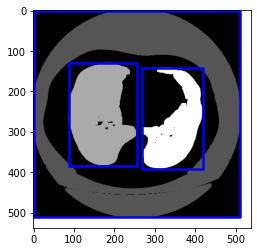

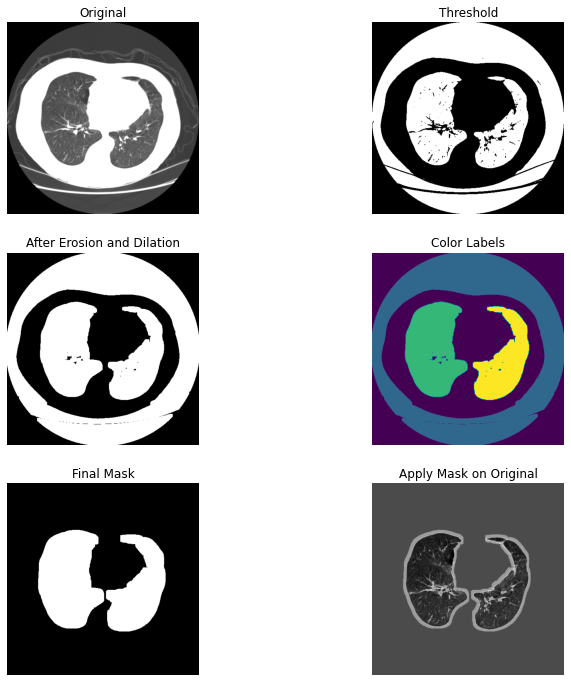

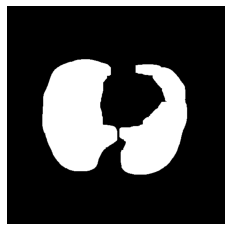

**************************************************************
***************************************************************


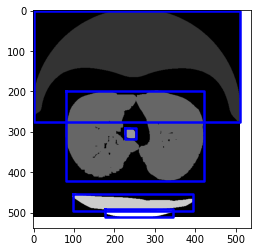

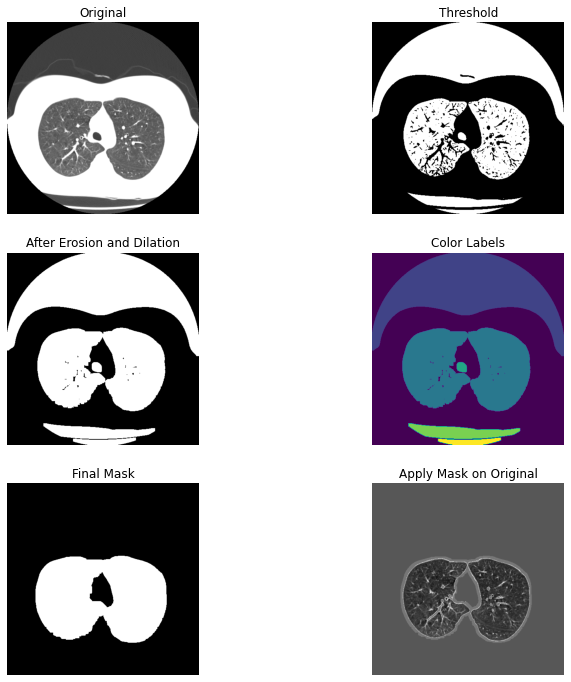

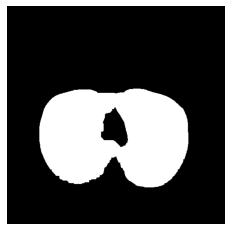

**************************************************************
***************************************************************


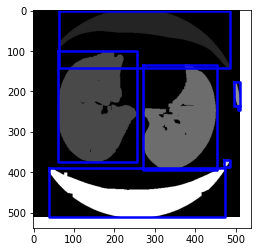

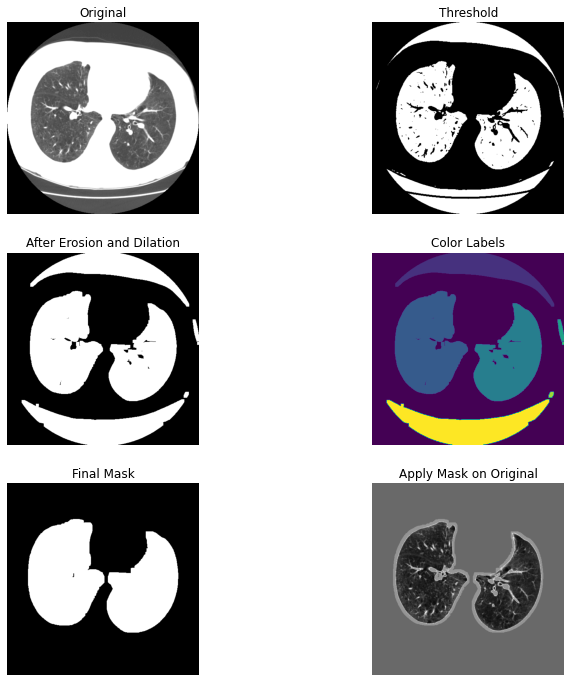

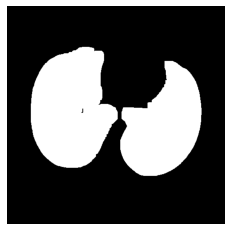

**************************************************************
***************************************************************


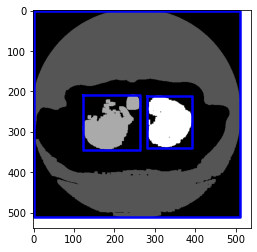

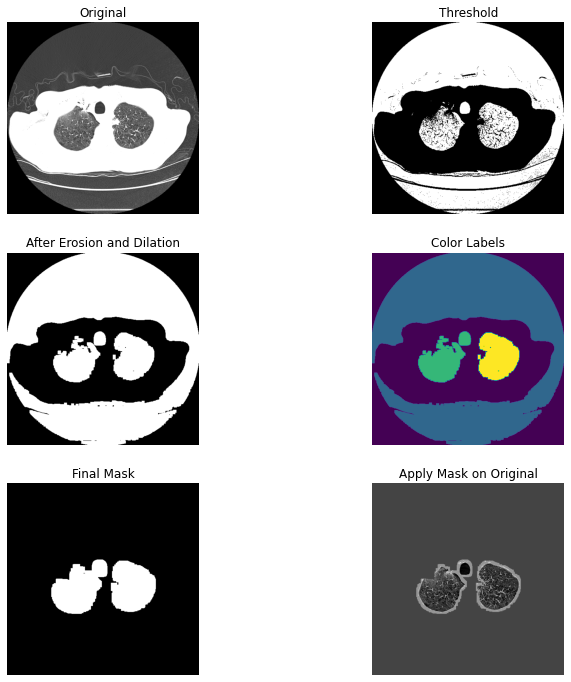

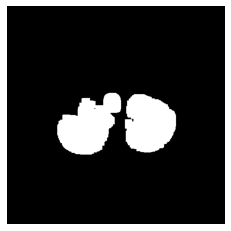

**************************************************************
***************************************************************


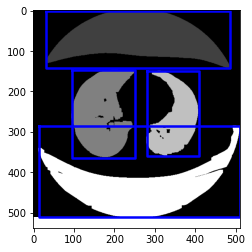

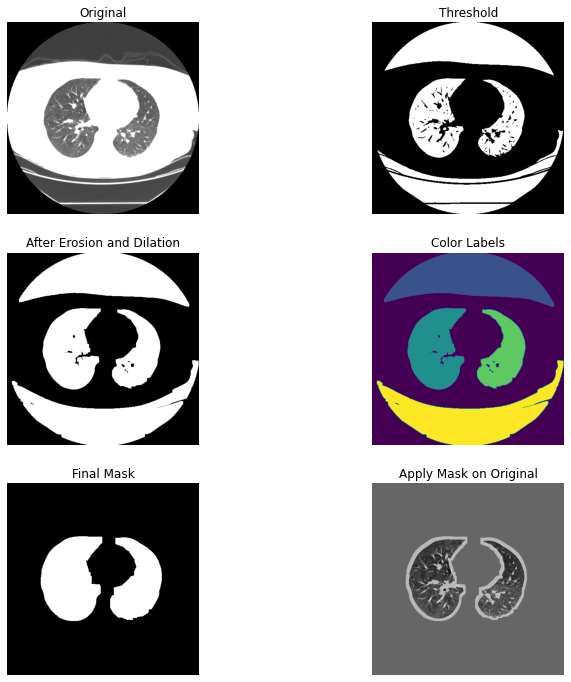

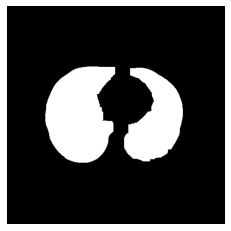

**************************************************************
***************************************************************


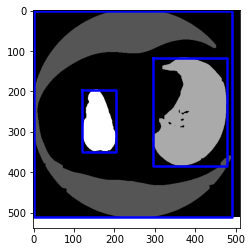

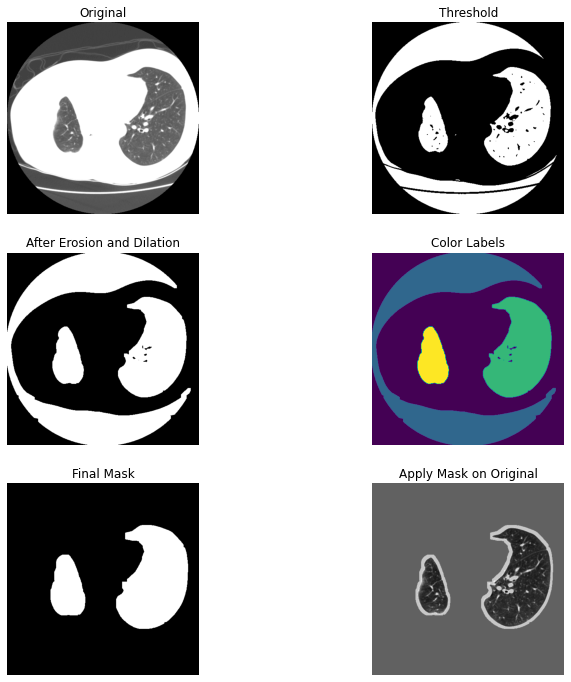

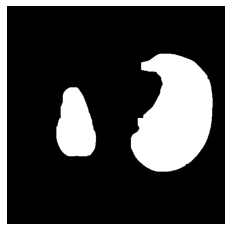

**************************************************************
***************************************************************


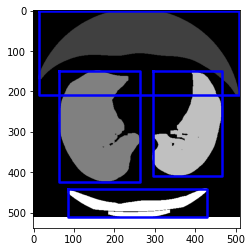

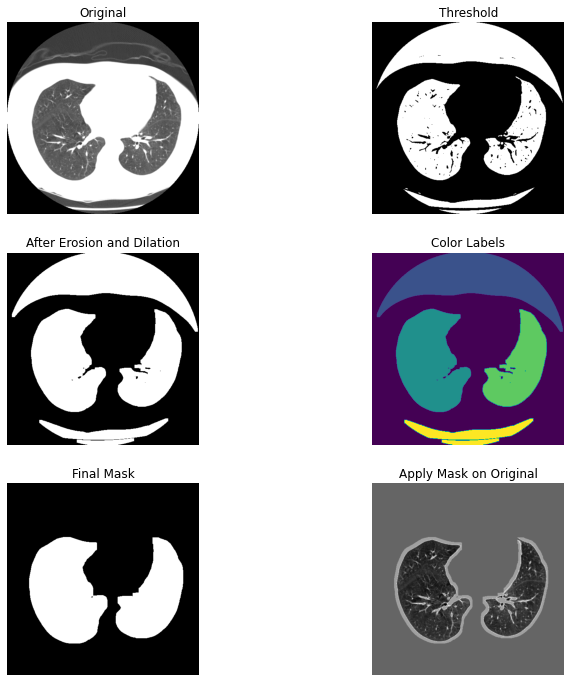

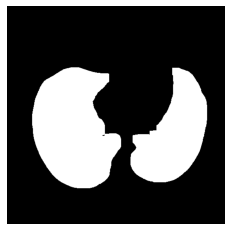

**************************************************************
***************************************************************


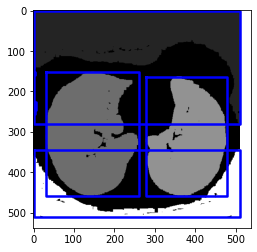

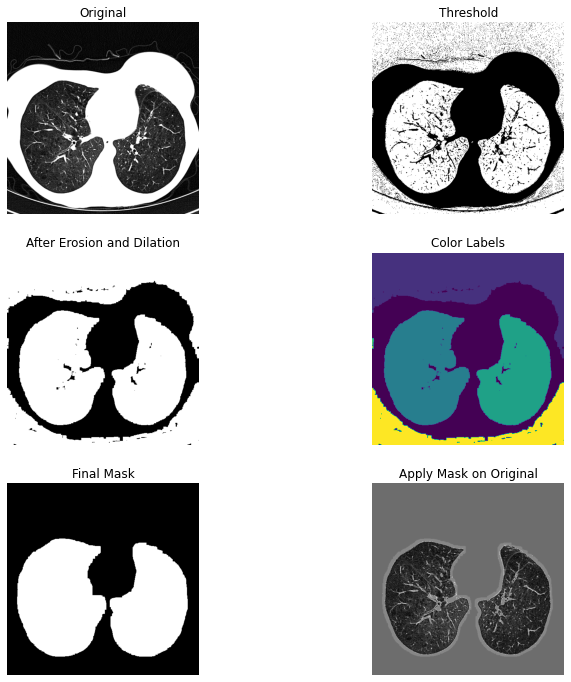

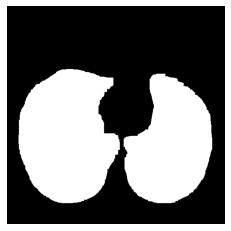

**************************************************************
***************************************************************


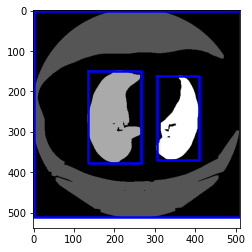

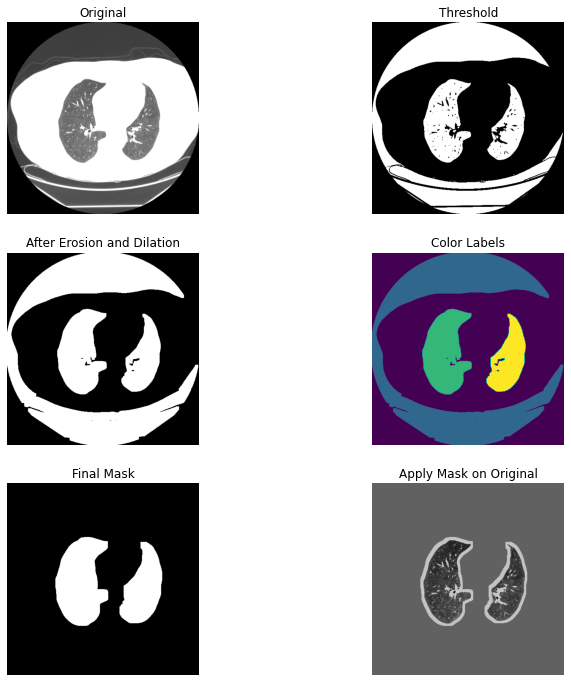

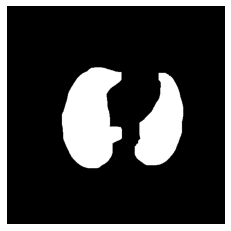

**************************************************************
***************************************************************


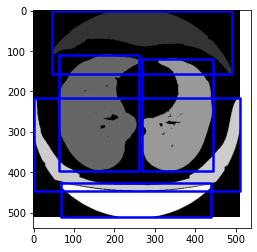

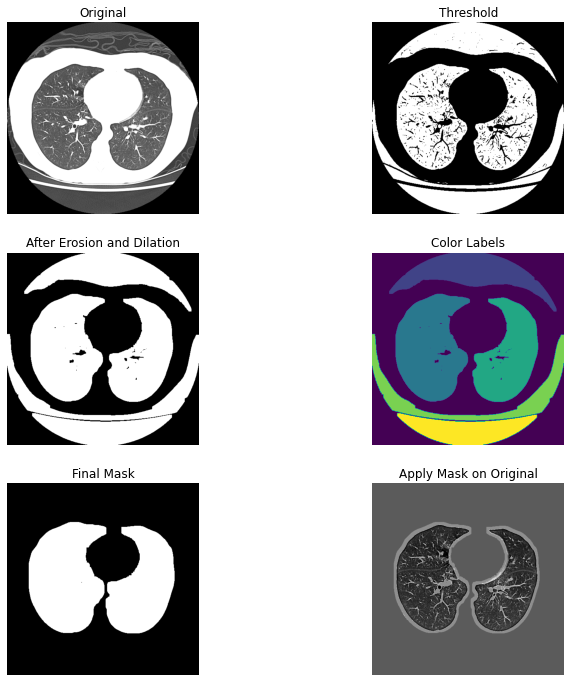

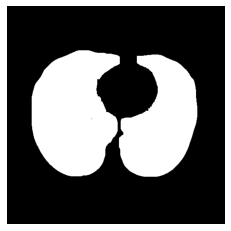

**************************************************************
***************************************************************


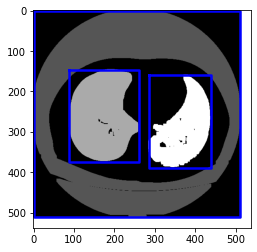

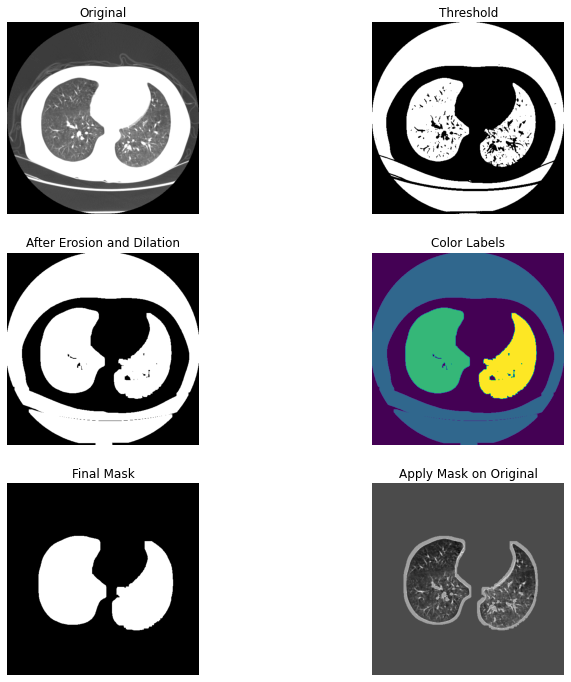

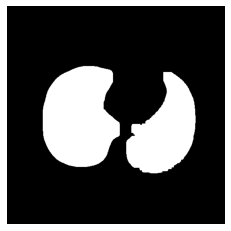

**************************************************************
***************************************************************


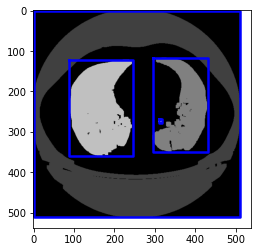

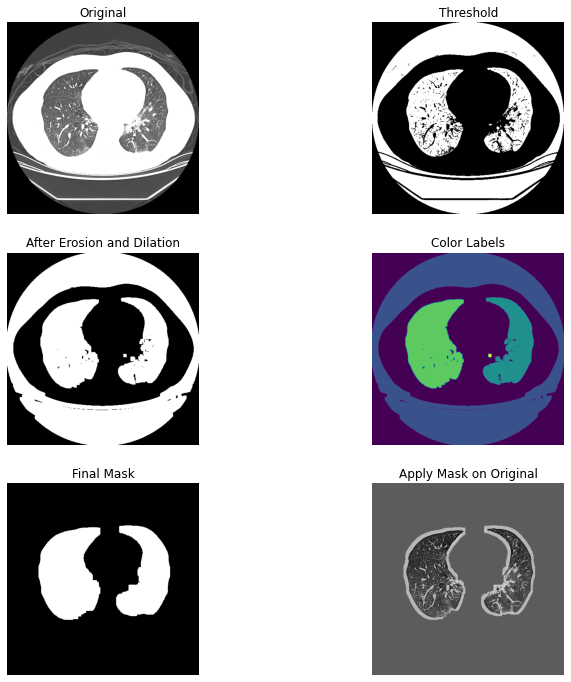

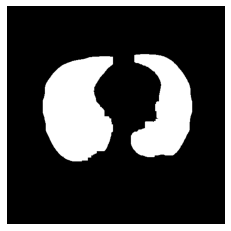

**************************************************************
***************************************************************


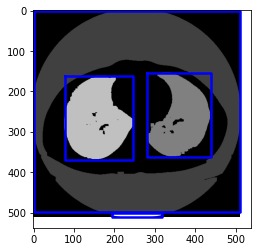

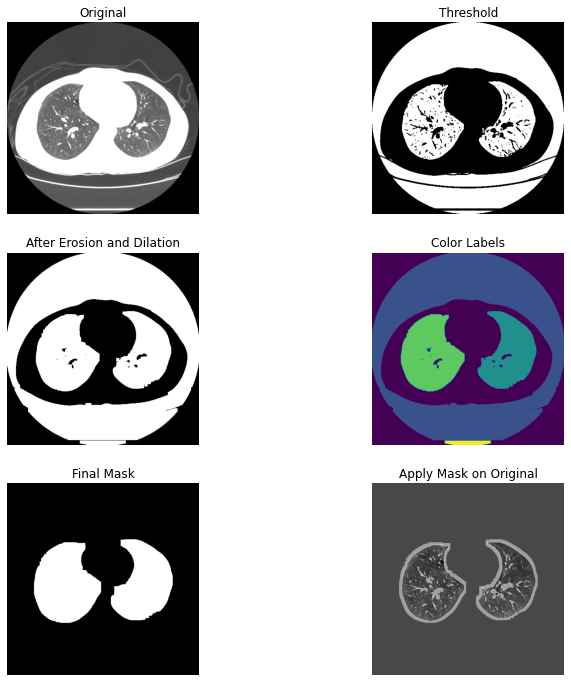

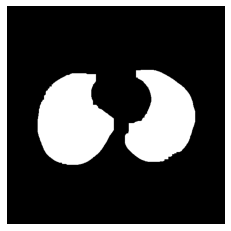

**************************************************************
***************************************************************


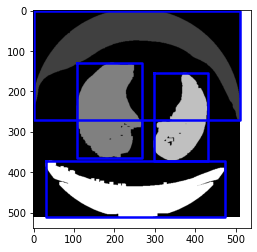

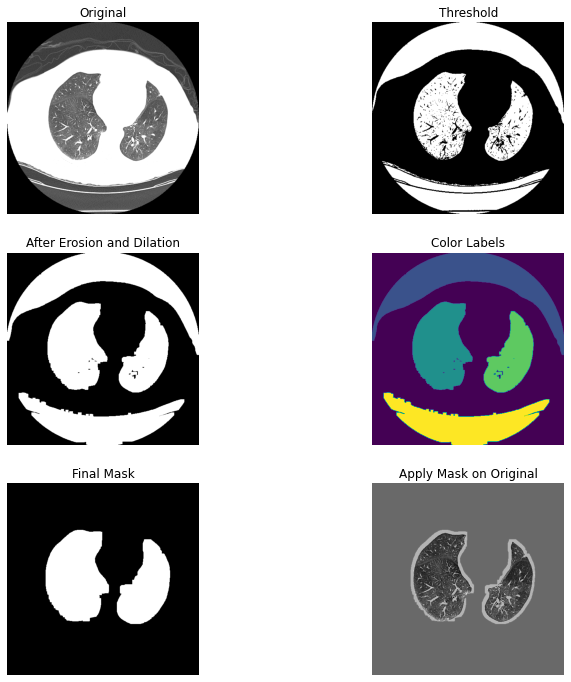

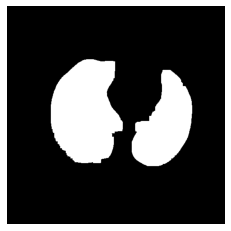

**************************************************************
***************************************************************


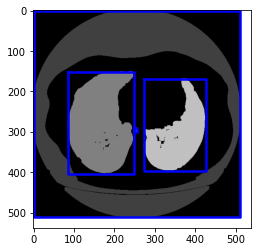

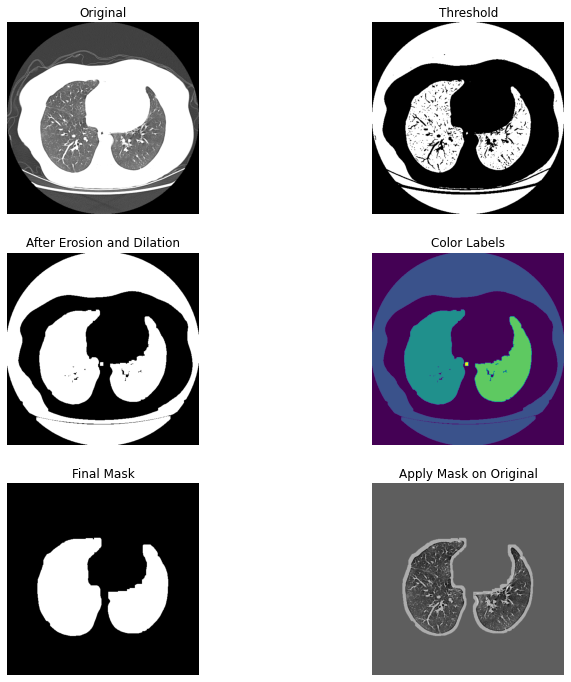

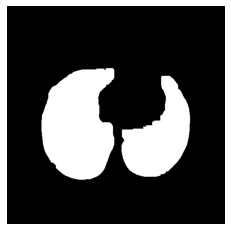

**************************************************************
***************************************************************


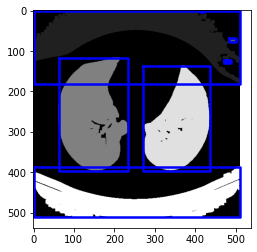

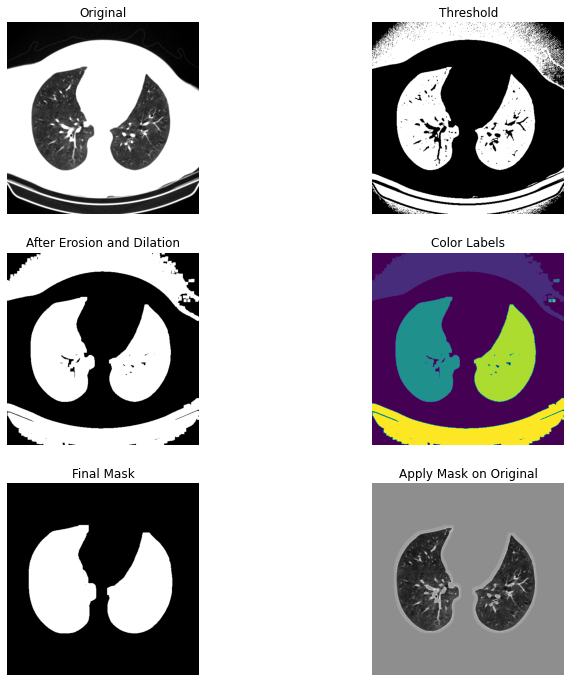

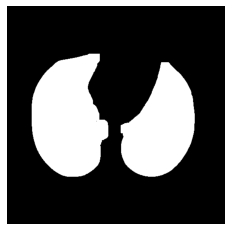

**************************************************************
***************************************************************


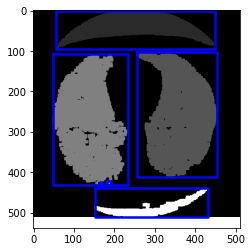

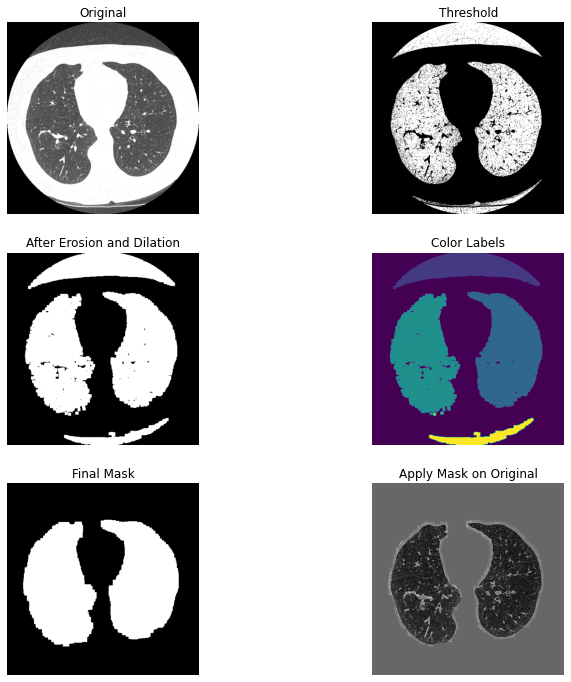

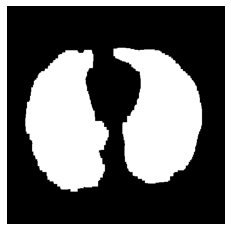

**************************************************************
***************************************************************


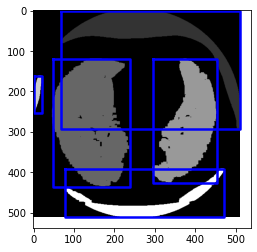

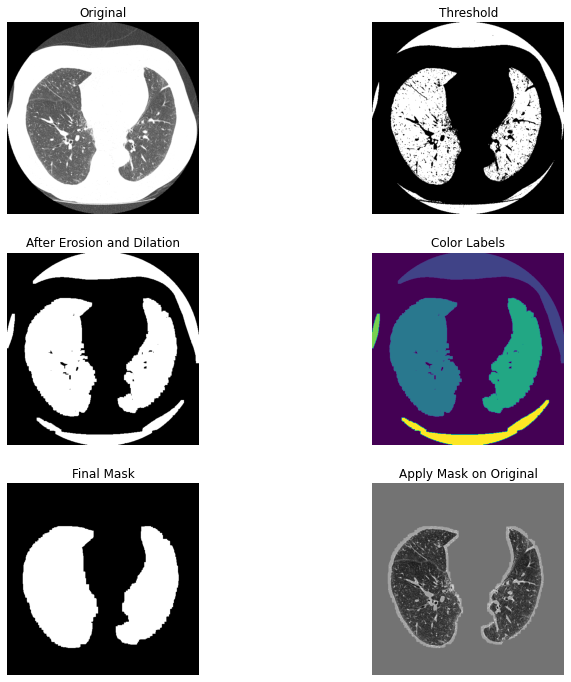

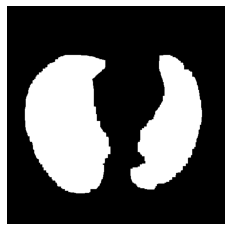

**************************************************************
***************************************************************


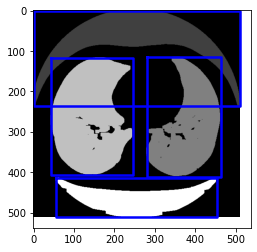

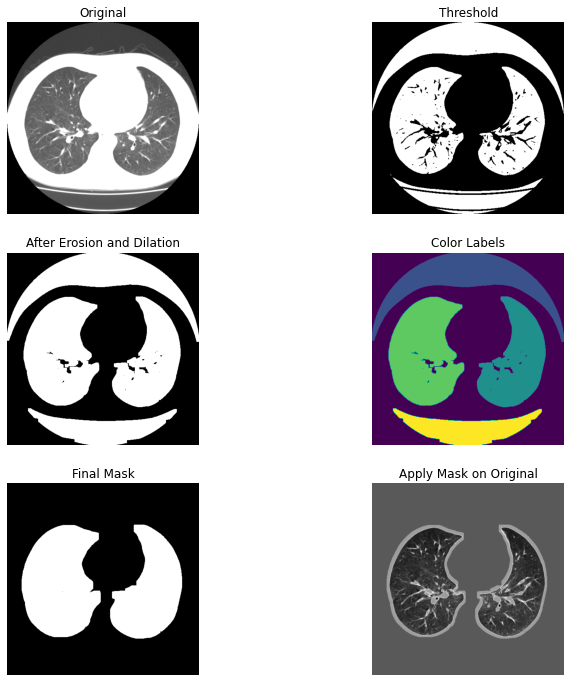

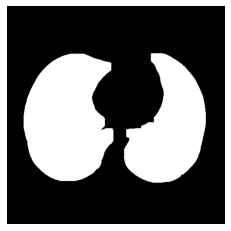

**************************************************************
***************************************************************


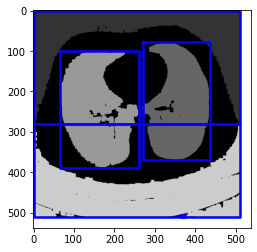

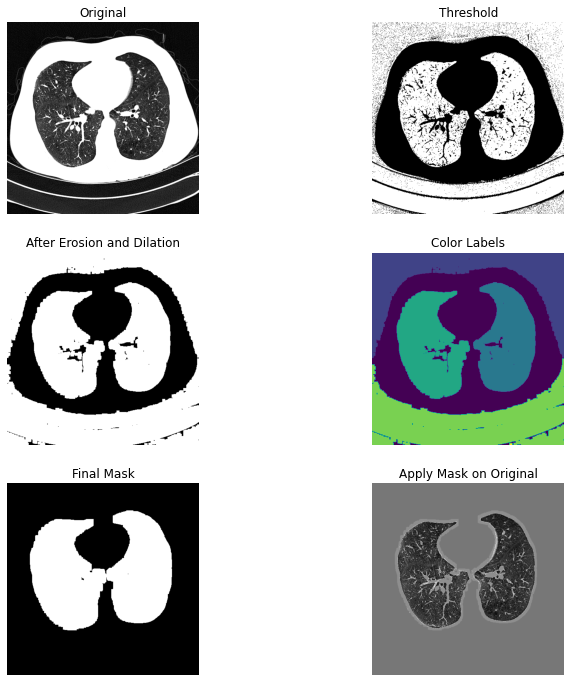

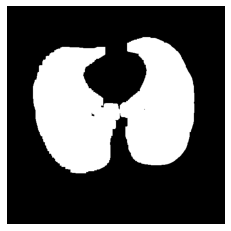

**************************************************************
***************************************************************


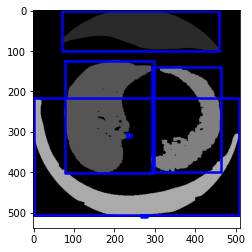

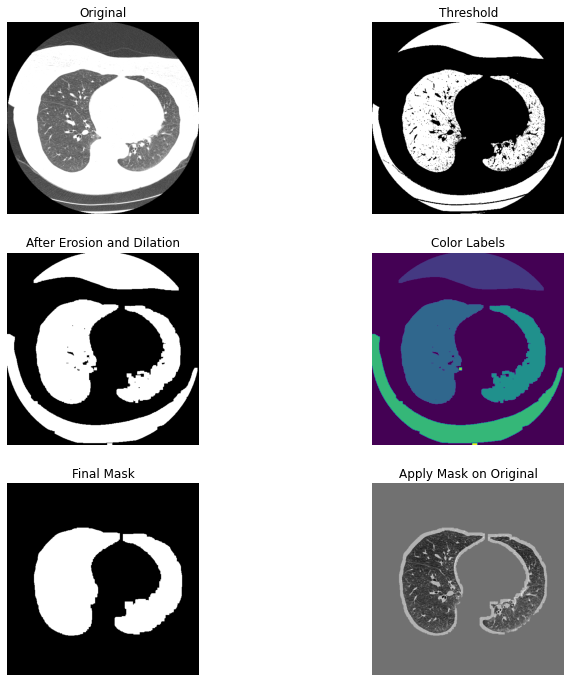

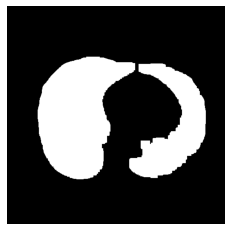

**************************************************************
***************************************************************


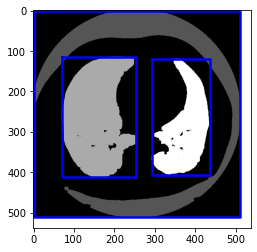

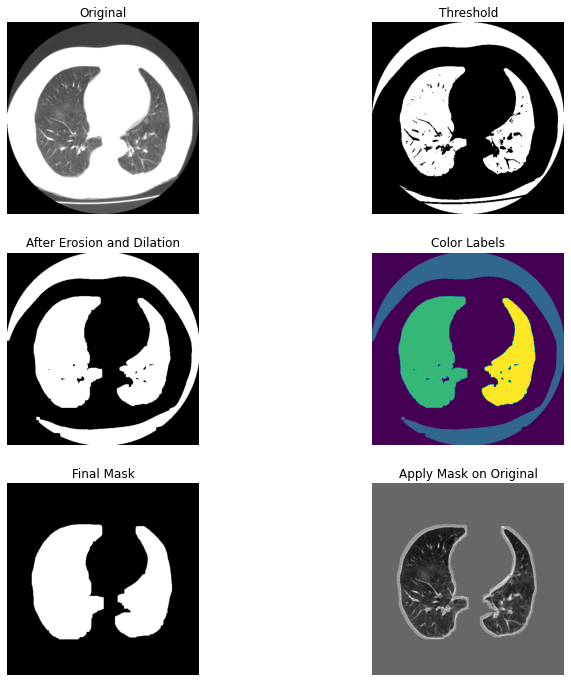

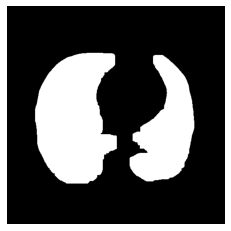

**************************************************************
***************************************************************


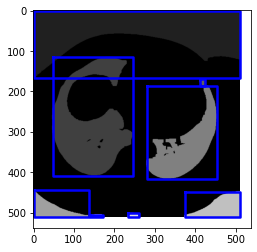

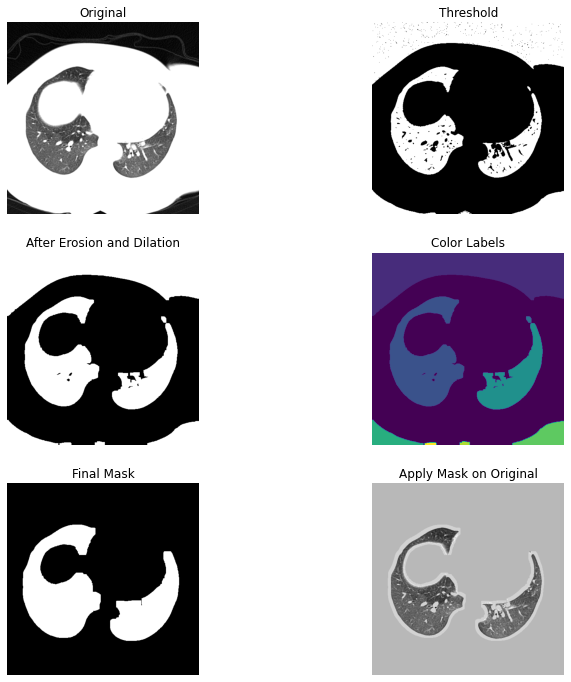

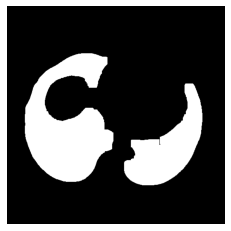

**************************************************************
***************************************************************


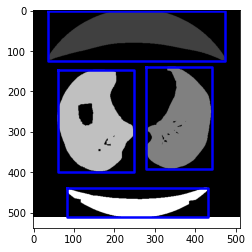

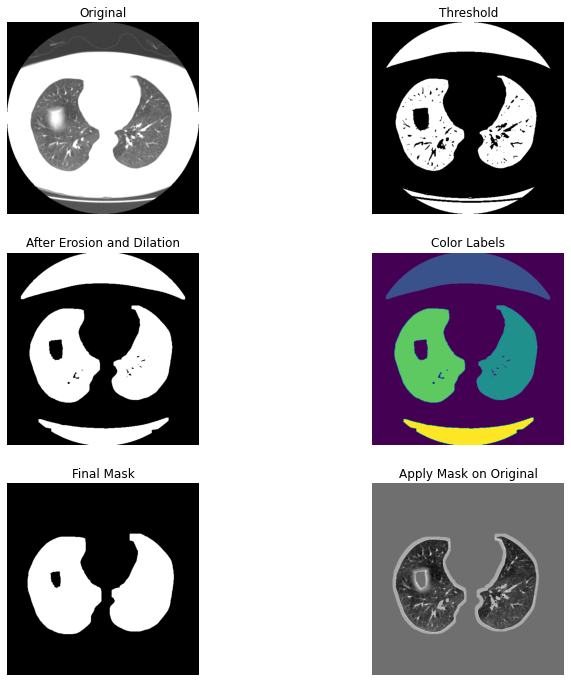

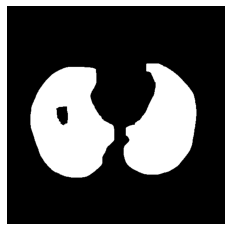

**************************************************************
***************************************************************


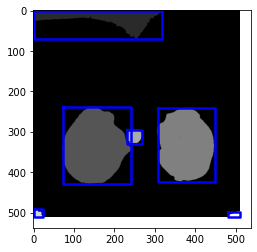

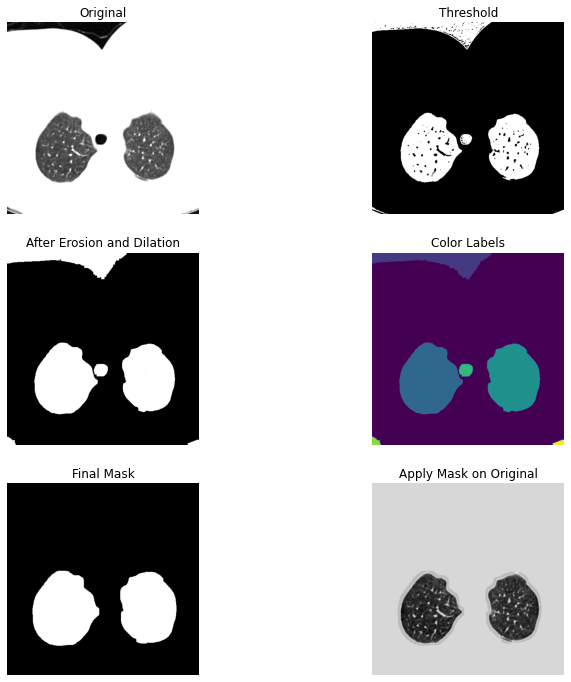

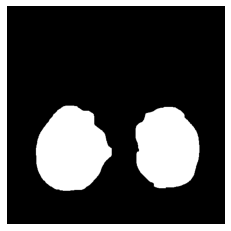

**************************************************************
***************************************************************


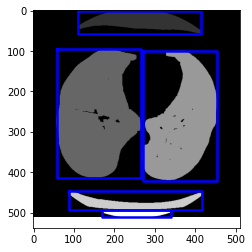

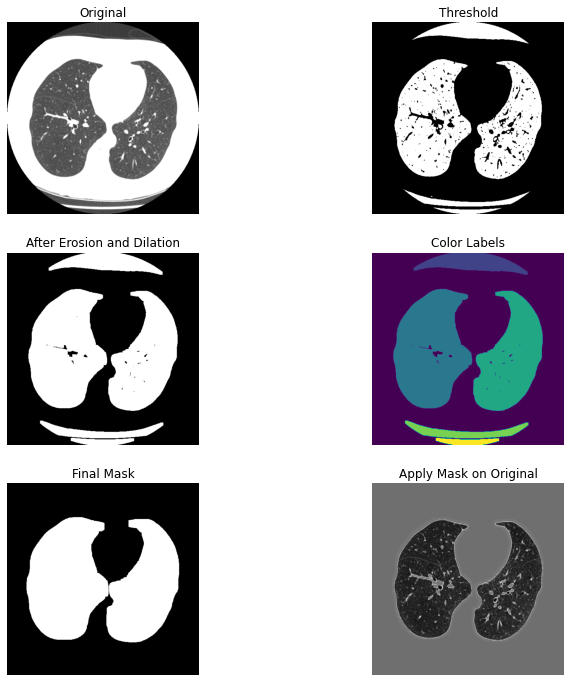

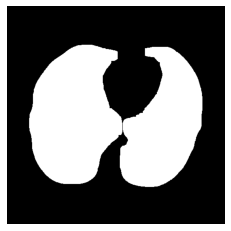

**************************************************************
***************************************************************


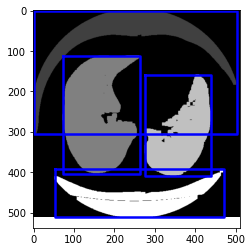

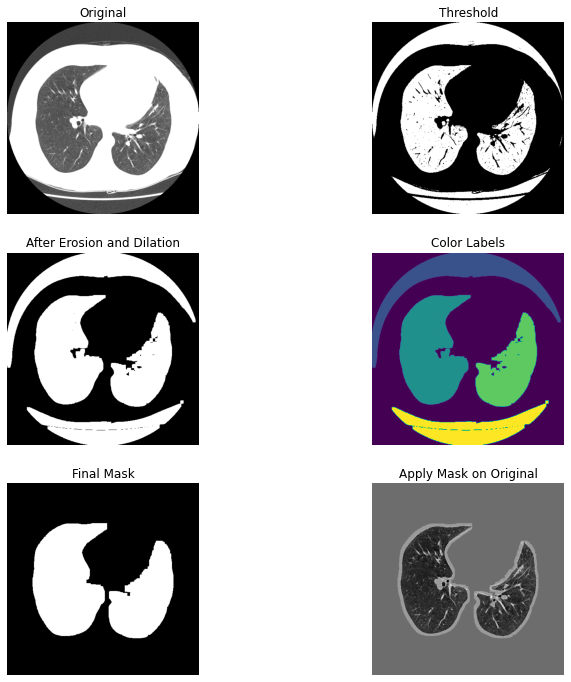

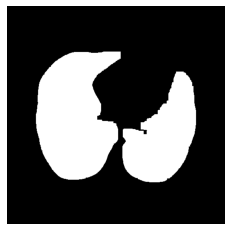

**************************************************************
***************************************************************


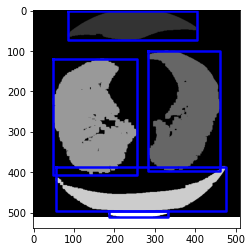

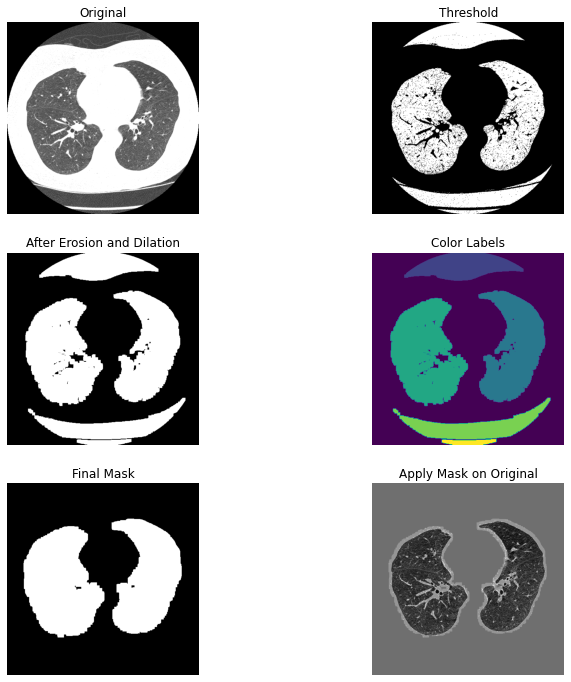

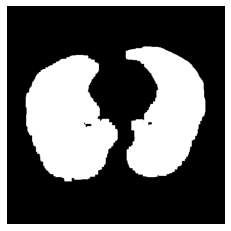

**************************************************************
***************************************************************


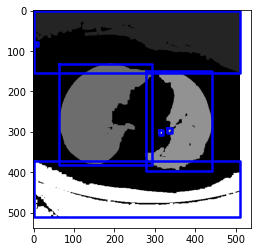

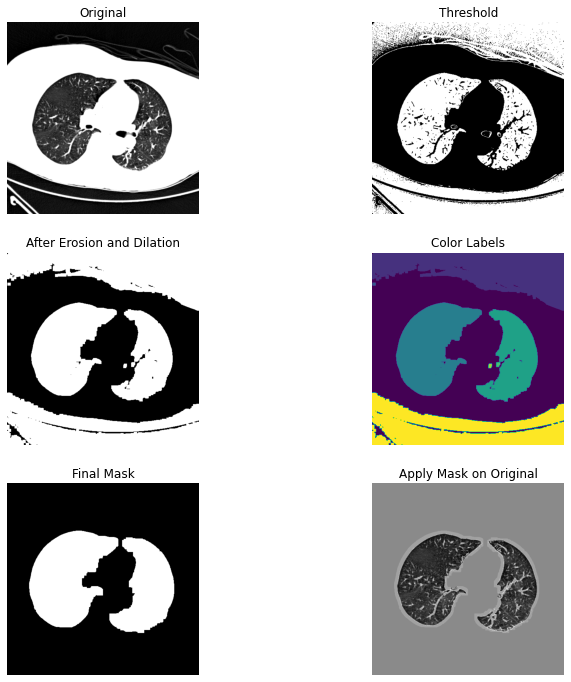

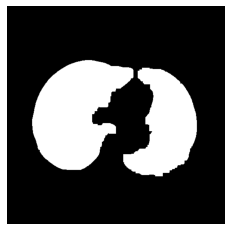

**************************************************************
***************************************************************


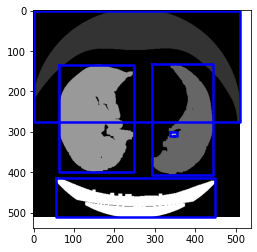

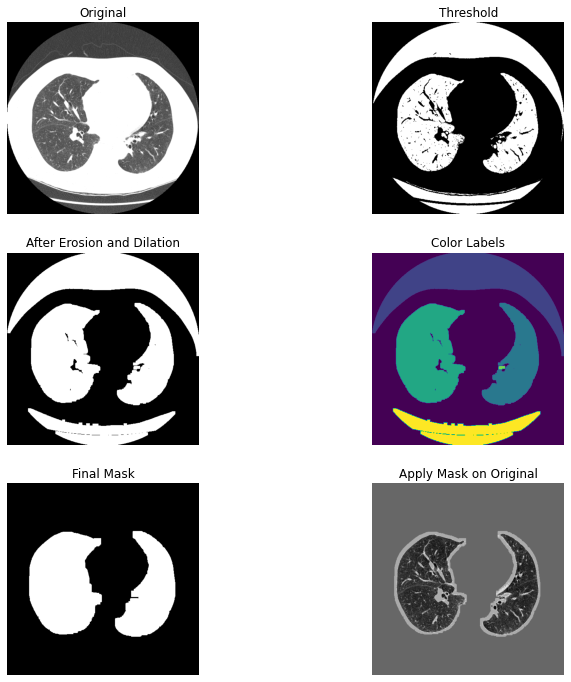

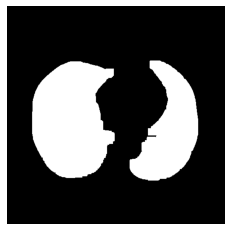

**************************************************************
***************************************************************


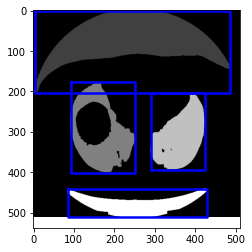

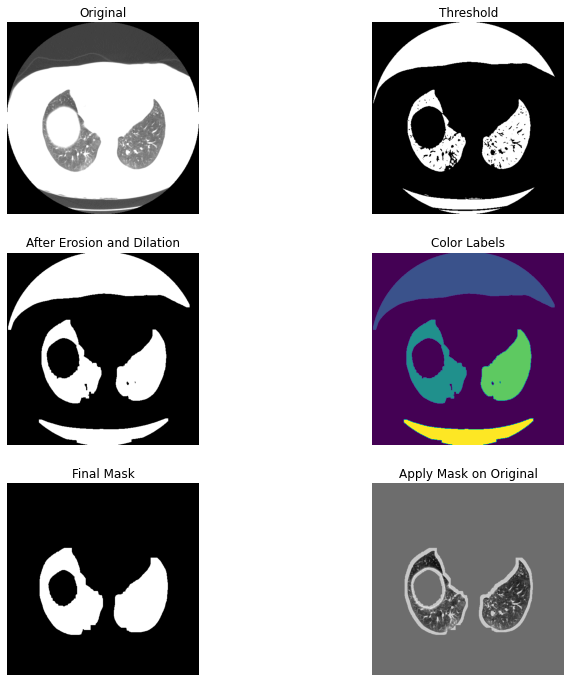

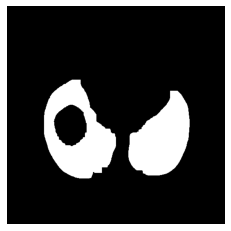

**************************************************************
***************************************************************


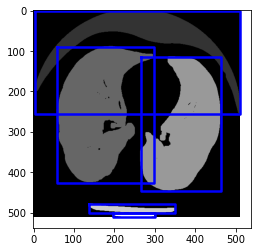

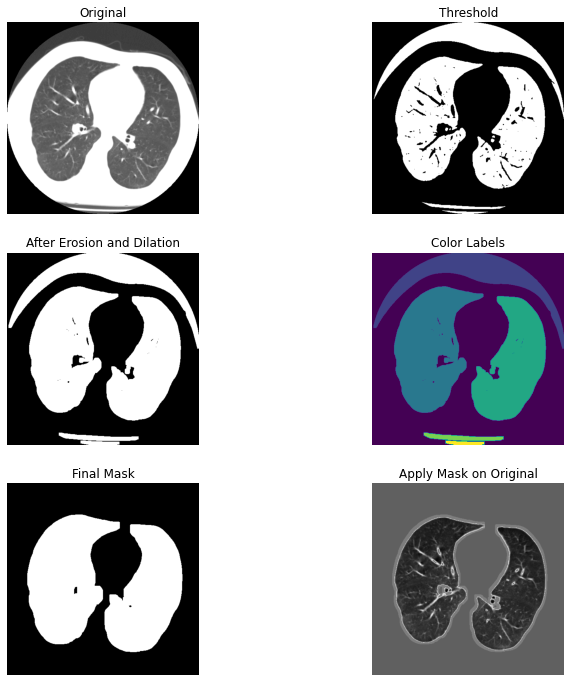

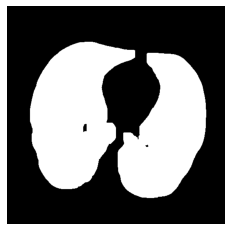

**************************************************************
***************************************************************


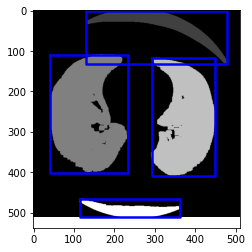

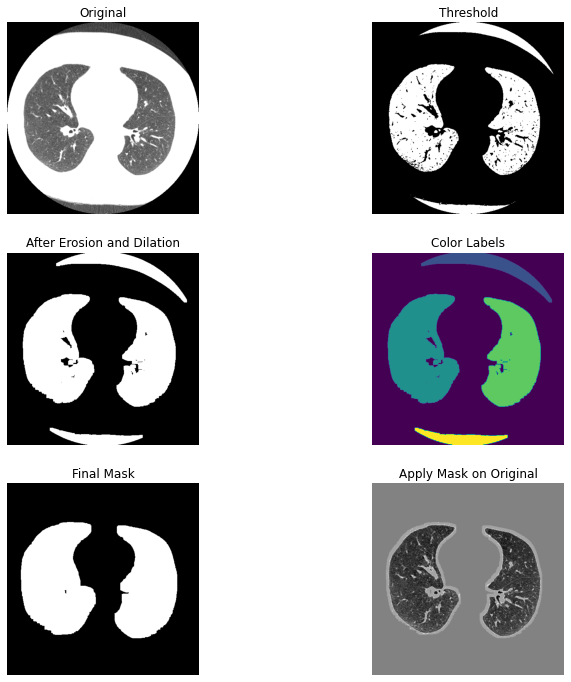

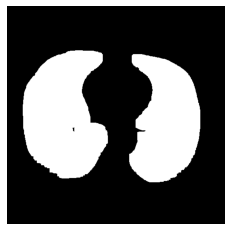

**************************************************************
***************************************************************


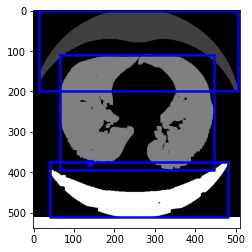

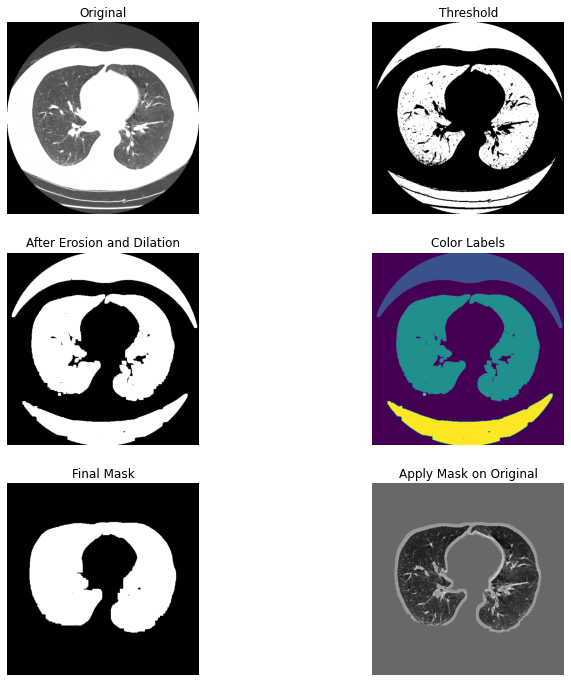

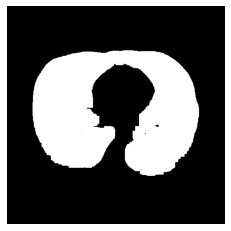

**************************************************************
***************************************************************


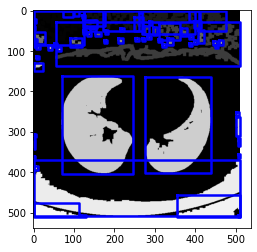

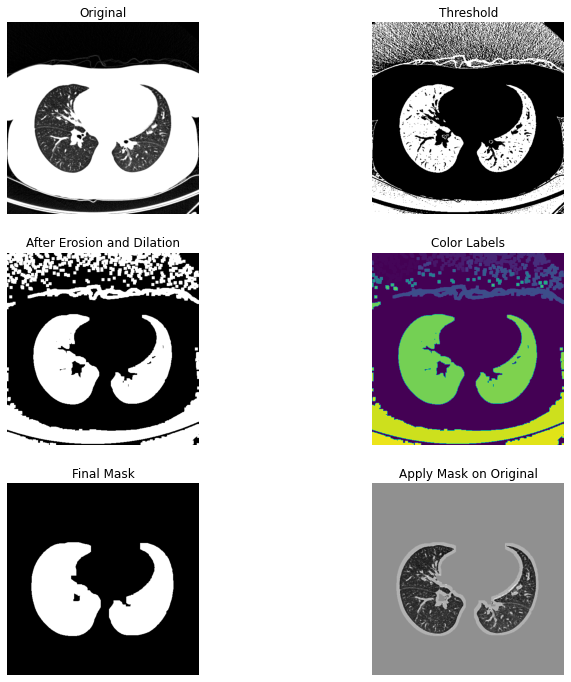

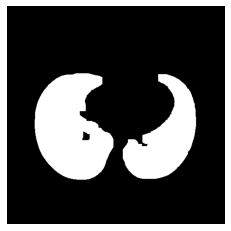

**************************************************************
***************************************************************


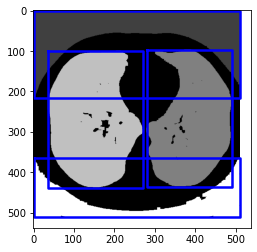

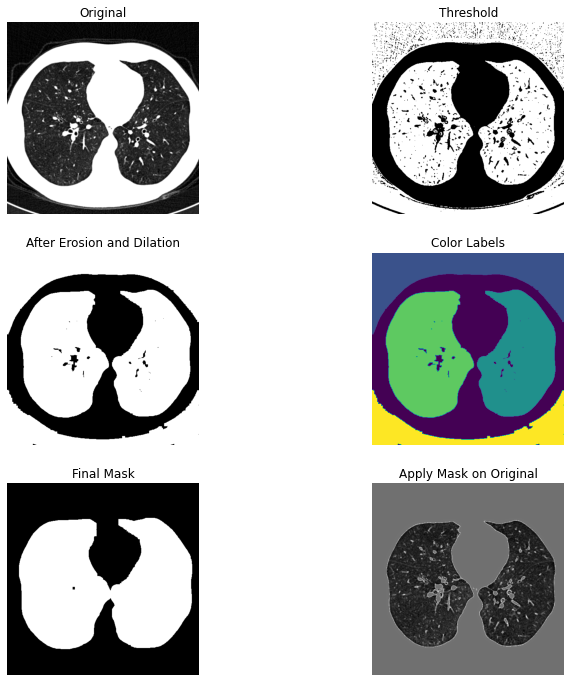

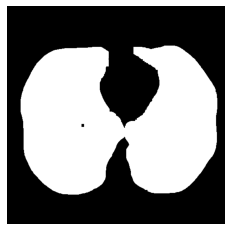

**************************************************************
***************************************************************


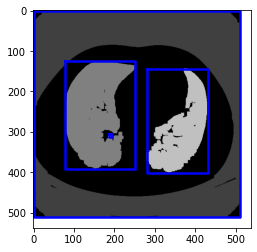

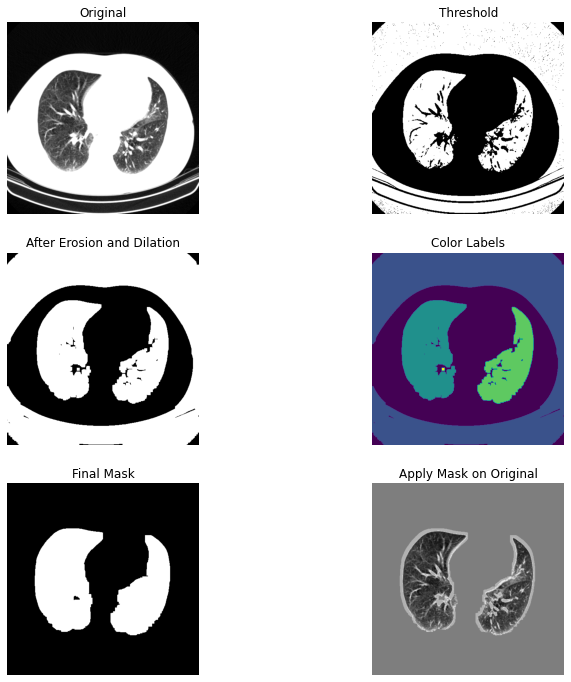

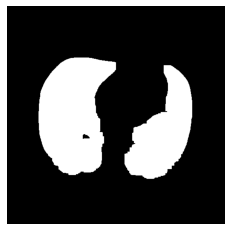

**************************************************************
***************************************************************


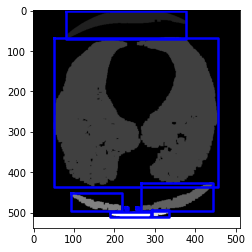

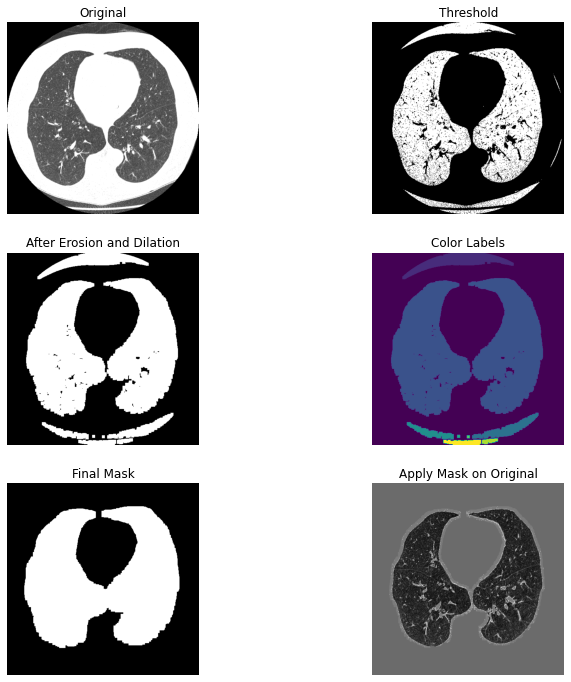

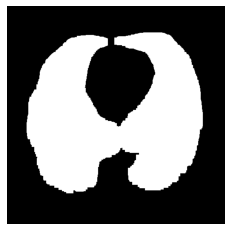

**************************************************************
***************************************************************


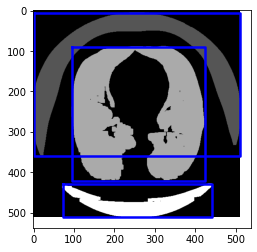

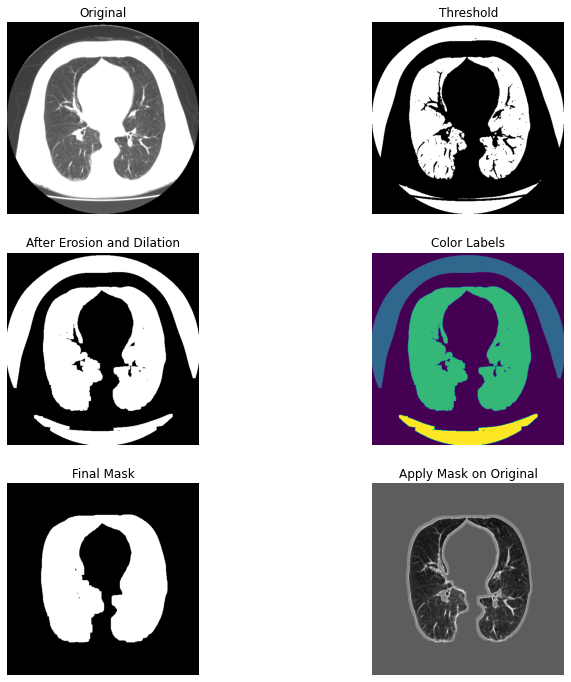

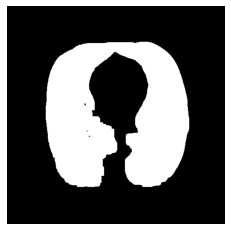

**************************************************************
***************************************************************


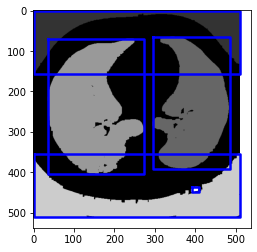

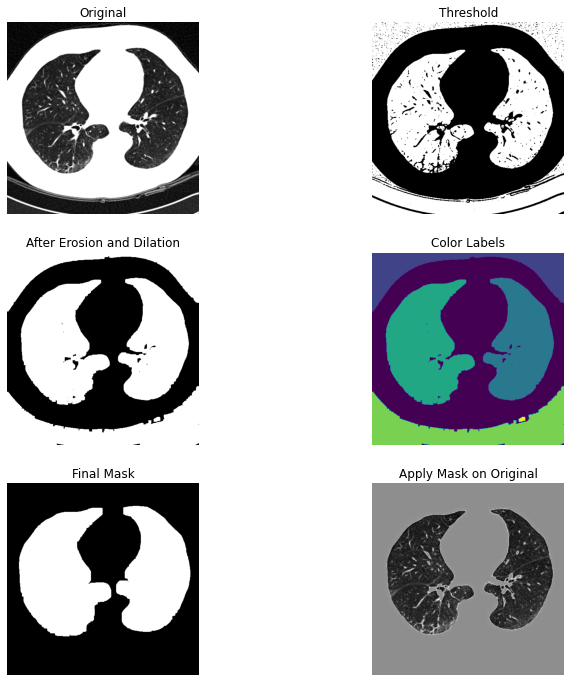

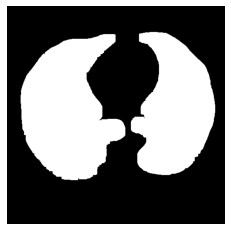

**************************************************************
***************************************************************


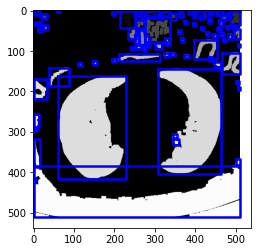

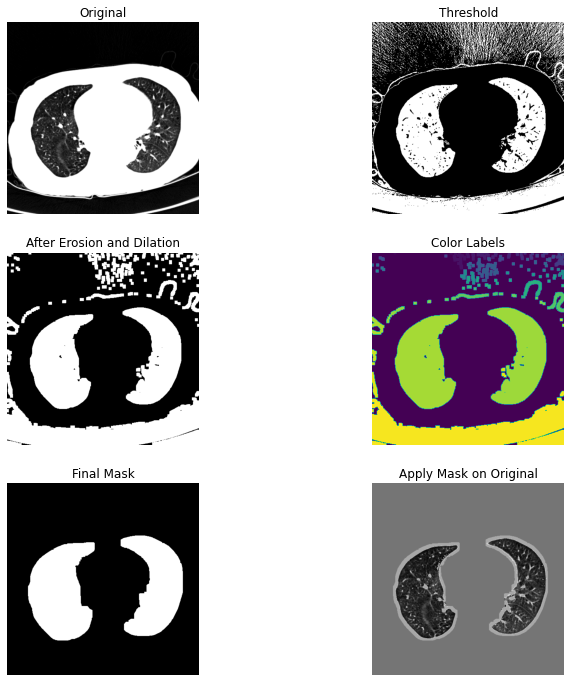

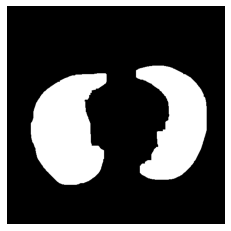

**************************************************************
***************************************************************


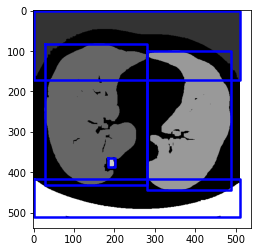

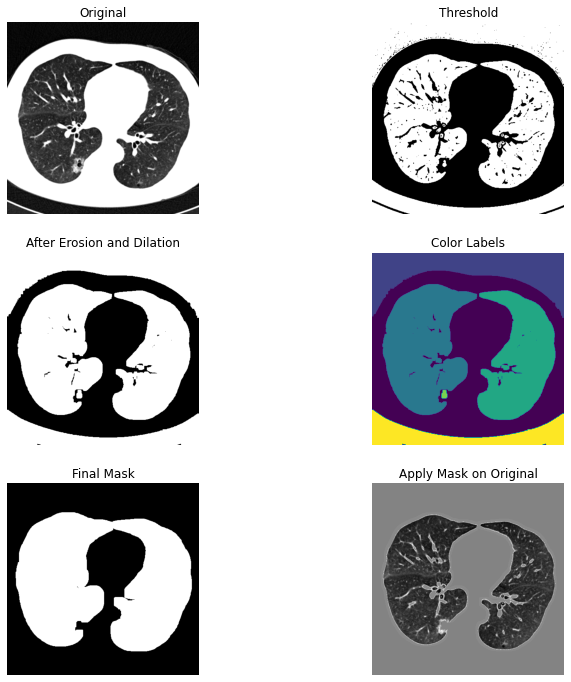

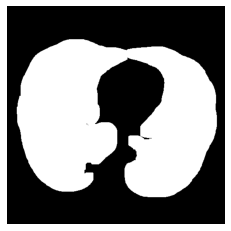

**************************************************************
***************************************************************


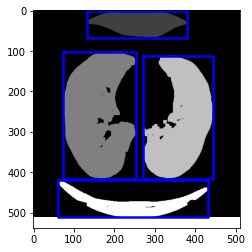

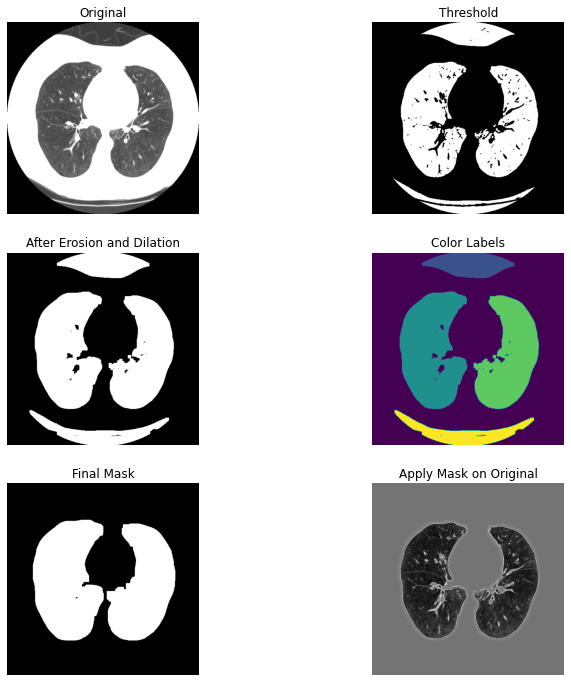

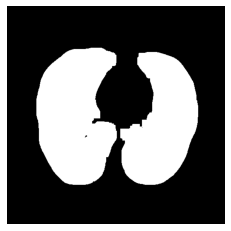

**************************************************************
***************************************************************


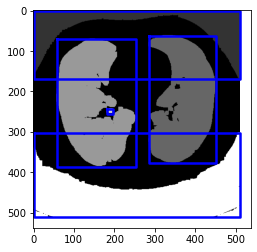

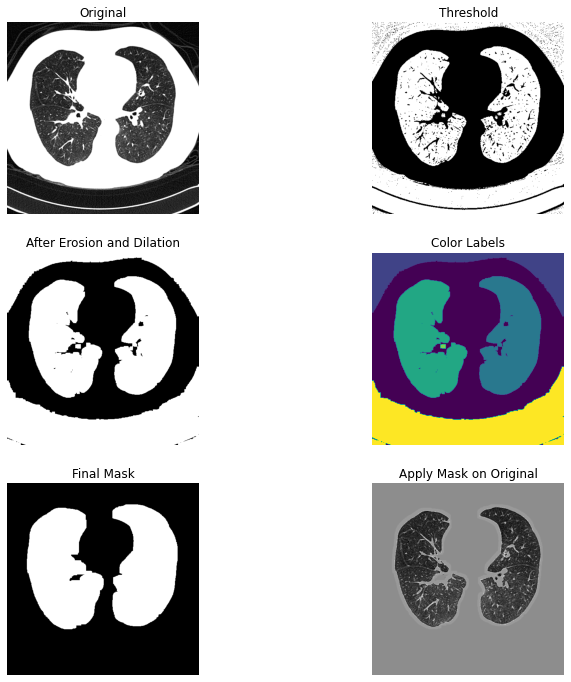

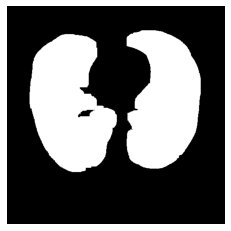

**************************************************************
***************************************************************


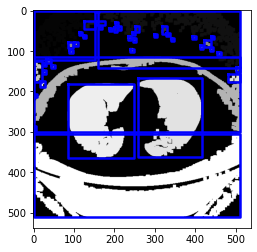

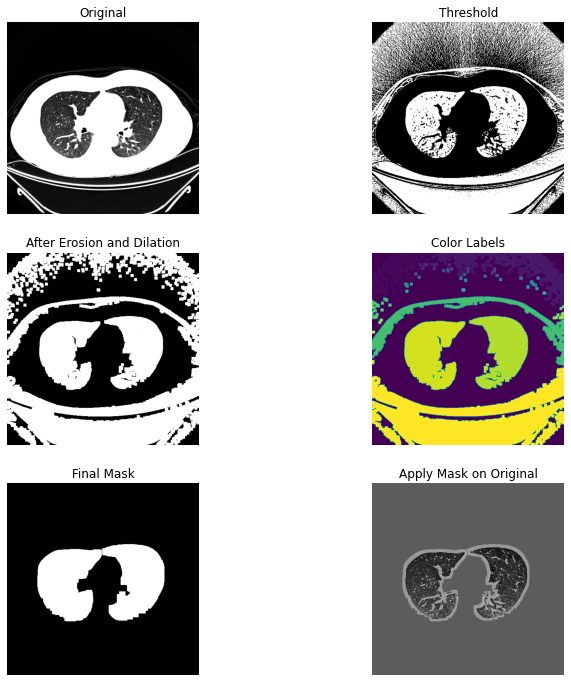

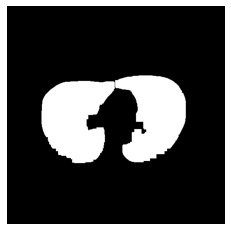

**************************************************************
***************************************************************


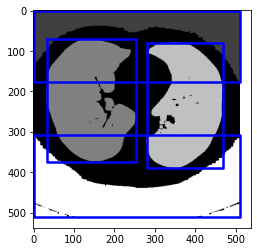

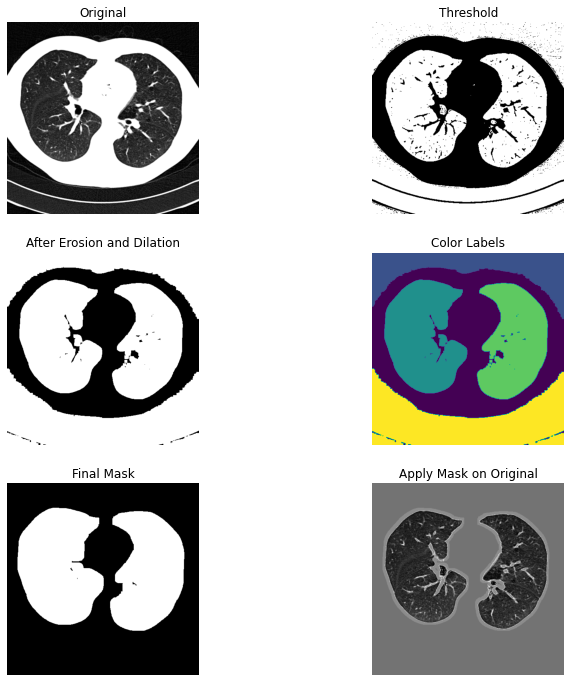

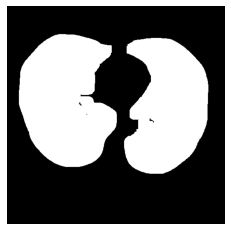

**************************************************************
***************************************************************


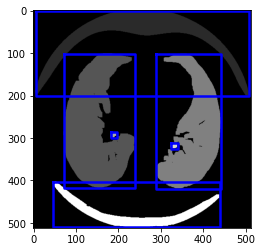

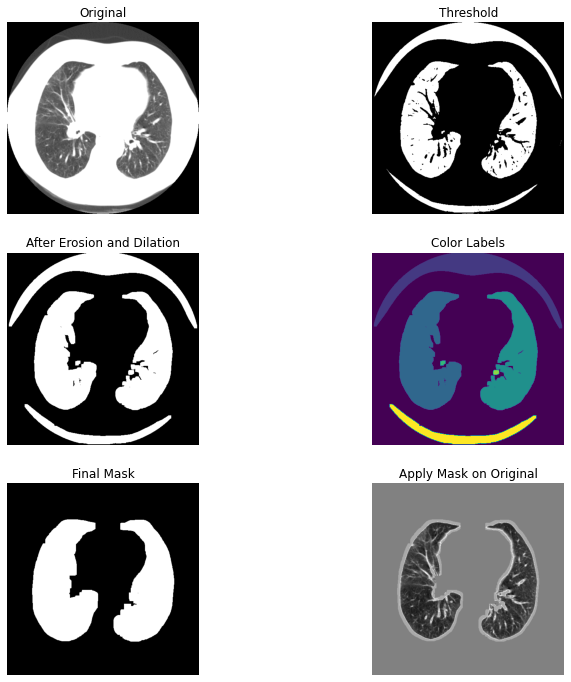

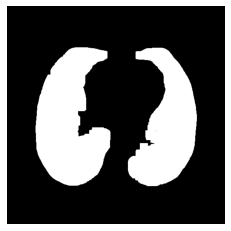

**************************************************************
***************************************************************


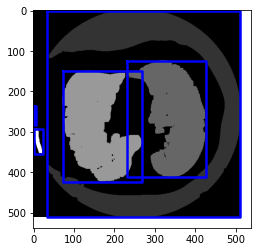

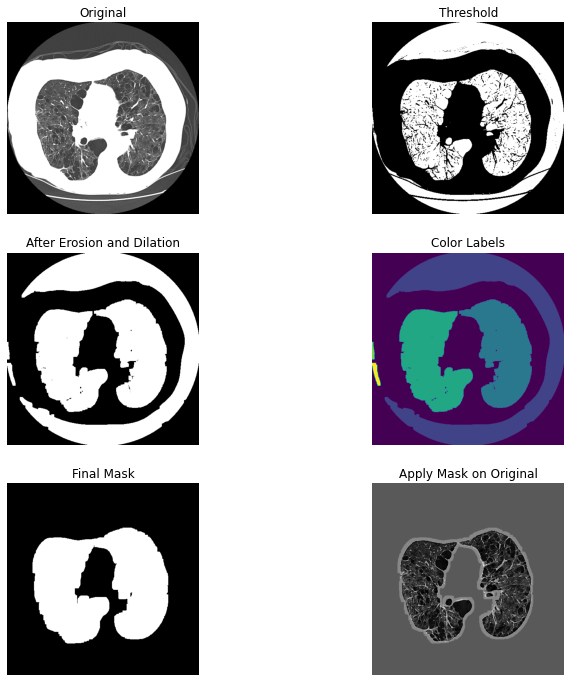

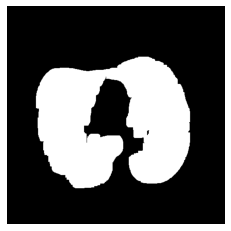

**************************************************************
***************************************************************


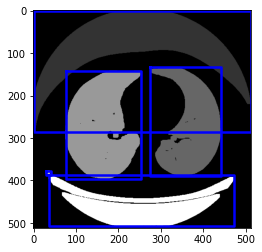

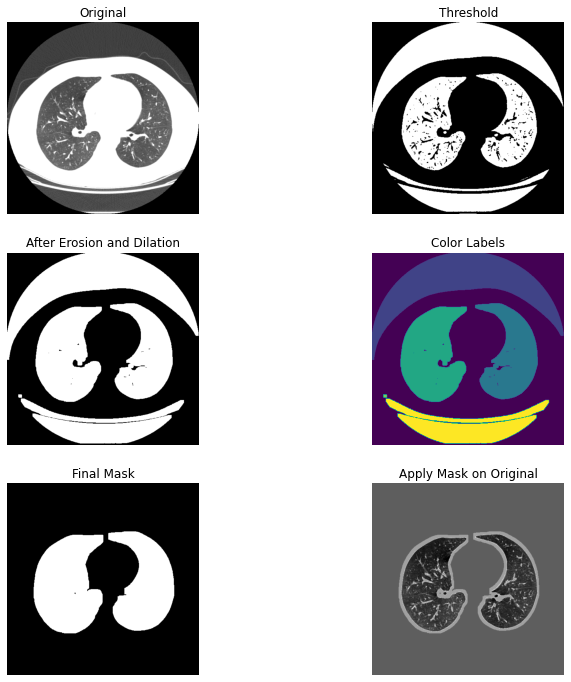

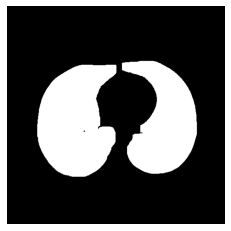

**************************************************************
***************************************************************


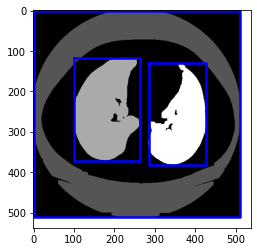

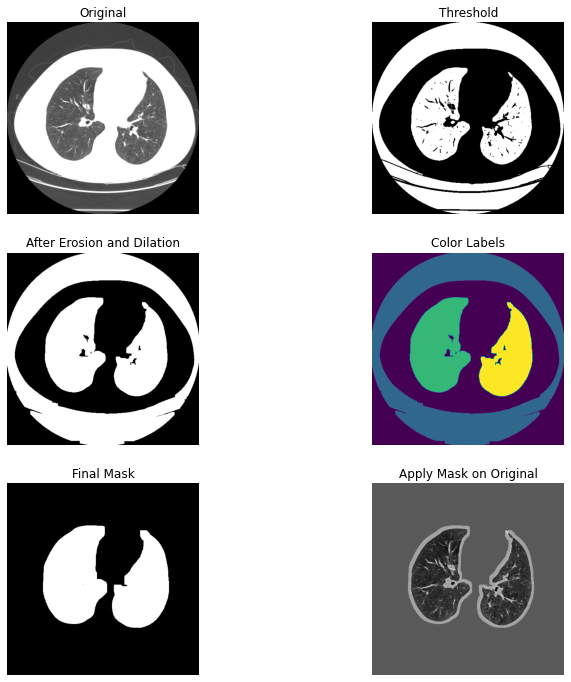

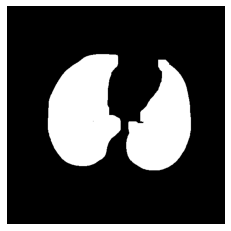

**************************************************************
***************************************************************


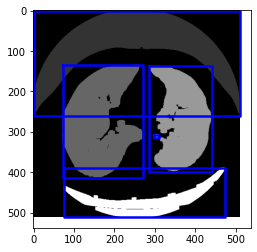

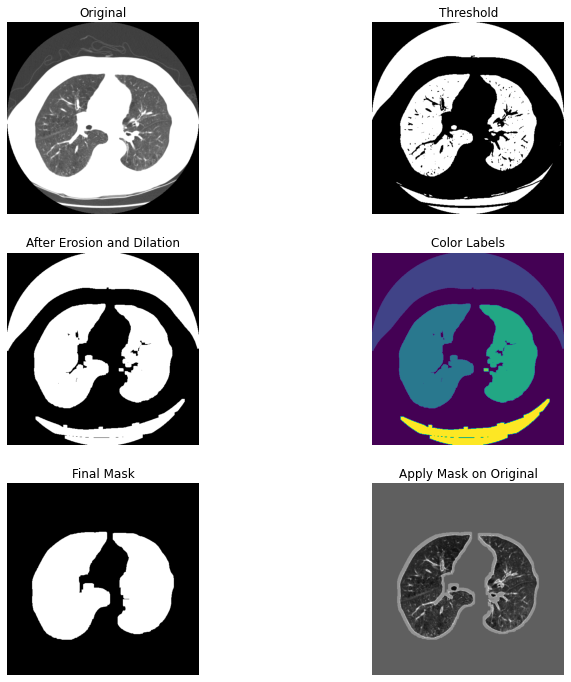

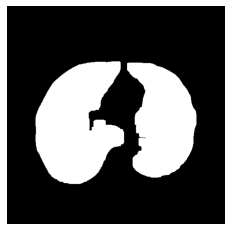

In [192]:
saving_filename= [] #variable holding name of the masks generated
# Define import path (i.e. where the original dataset is stored)
importing_path = r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Data\Original'
outputting_path= r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\edge_output_path'
#Define paths to save masks and subplots
saving_subplots_path=r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Jupyter subplots'
saving_masks_path=r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Jupyter masks'

mid_slices, list_of_filepaths= load_mid_slices(importing_path) #get slices and file path names, and pass these into normalize_scans as scans
for x in range(51): #0 to 50
    saving_filename.append(list_of_filepaths[x].split('\\')[9] + '.jpg') #split entire directory and get 9th index (just the LIDC-IDRI-0XXX part)

#Loop through all the scans (index 0 to 50)
for mid_slice_index in range(51):
    imgs = normalize_scans(mid_slices[mid_slice_index])
    np.save(outputting_path + "fullimages.npy", imgs) 

    print('**************************************************************')

    imgs_to_process = np.load(outputting_path+'fullimages.npy')


    print('***************************************************************')
    plot_thresh_img, plot_dilation, plot_labels, plot_mask, plot_apply_mask= make_lungmask(imgs_to_process)

    #plot imgs 
    fig, ax = plt.subplots(3, 2, figsize=[12, 12])
    ax[0, 0].set_title("Original")
    ax[0, 0].imshow(imgs_to_process, cmap='gray')
    ax[0, 0].axis('off')
    ax[0, 1].set_title("Threshold")
    ax[0, 1].imshow(plot_thresh_img, cmap='gray')
    ax[0, 1].axis('off')
    ax[1, 0].set_title("After Erosion and Dilation")
    ax[1, 0].imshow(plot_dilation, cmap='gray')
    ax[1, 0].axis('off')
    ax[1, 1].set_title("Color Labels")
    ax[1, 1].imshow(plot_labels)
    ax[1, 1].axis('off')
    ax[2, 0].set_title("Final Mask")
    ax[2, 0].imshow(plot_mask, cmap='gray')
    ax[2, 0].axis('off')
    ax[2, 1].set_title("Apply Mask on Original")
    ax[2, 1].imshow(plot_apply_mask, cmap='gray')
    ax[2, 1].axis('off')

    plt.savefig(saving_subplots_path + '/'+ saving_filename[mid_slice_index])
    plt.show()
    
    plt.imshow(plot_mask, cmap='gray')
    plt.axis('off')
    plt.savefig(saving_masks_path + '/'+ saving_filename[mid_slice_index], bbox_inches='tight',pad_inches = 0)
    plt.show()

## MSE, SSIM and DICE Correlation Coeficient 

In [45]:
def mse(imageA, imageB):
    # the 'Mean Squared Error' between the two images is the
    # sum of the squared difference between the two images;
    # NOTE: the two images must have the same dimension
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    # return the MSE, the lower the error, the more "similar"
    # the two images are
    return err

In [46]:
def dice_coefficient(predicted_label,target_label):
    dice = (2*predicted_label*target_label).sum() / (predicted_label.sum()+target_label.sum())
    return dice

In [47]:
def compare_images(imageA, imageB):
    # compute the mean squared error and structural similarity
    # index for the images
    m = mse(imageA, imageB)
    s = metrics.structural_similarity(imageA, imageB)
    d = dice_coefficient(imageA, imageB)
    # setup the figure
    fig = plt.figure()
    plt.suptitle("MSE: %.2f, SSIM: %.2f, Dice Coeff: %.2f" % (m, s, d))
    # show first image
    ax = fig.add_subplot(1, 2, 1, title='Manual')
    plt.imshow(imageA, cmap = plt.cm.gray)
    plt.axis("off")
    # show the second image
    ax = fig.add_subplot(1, 2, 2, title='Automatic')
    plt.imshow(imageB, cmap = plt.cm.gray)
    plt.axis("off")
    # show the images
    plt.show()
    print(d)
    return m,s,d


*********** Automatic and First Set of Manual*************


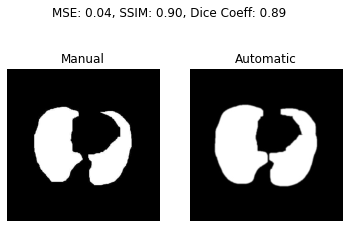

0.8908525022292758


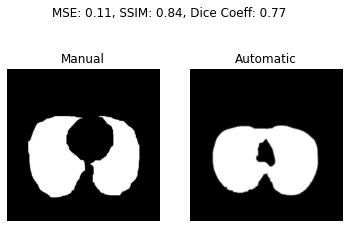

0.7700178306548446


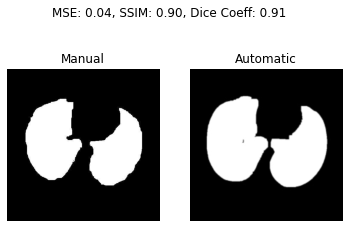

0.9121214229464201


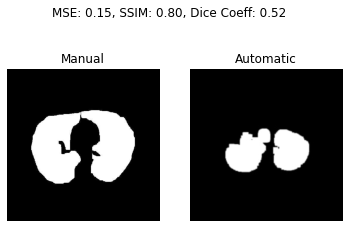

0.5164605505578097


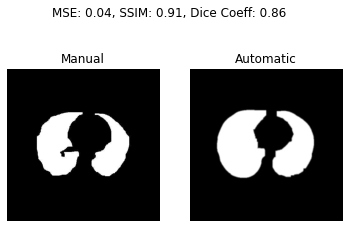

0.8552127927283221


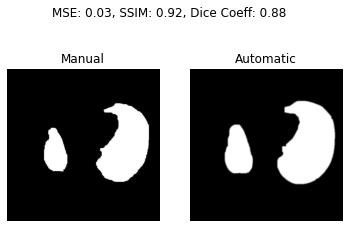

0.8833792020110013


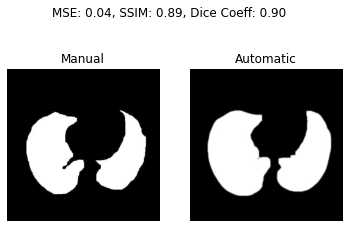

0.8985750429759591


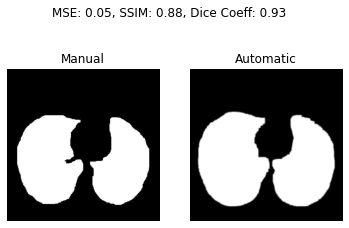

0.9258898178668722


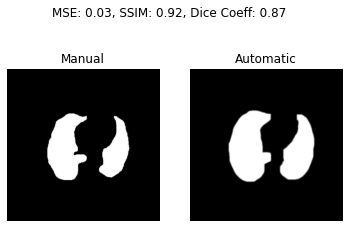

0.8693608479823814


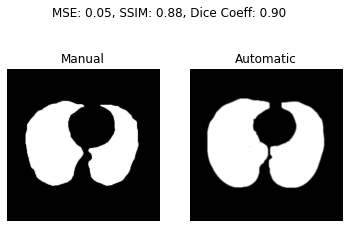

0.9027494622091008


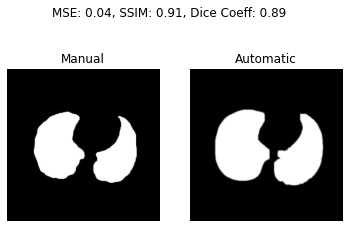

0.8904513798832712


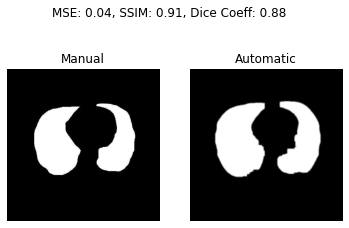

0.883798473084027


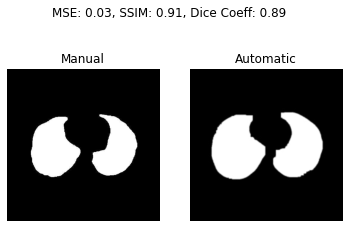

0.8879201619784605


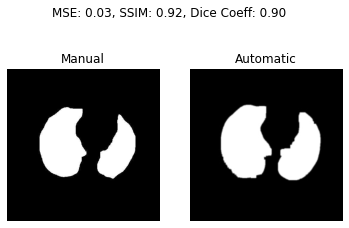

0.8984567139491397


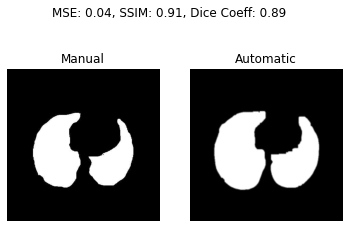

0.8949113041823153


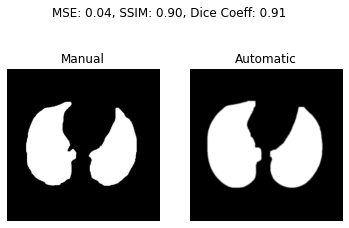

0.9109392779126928


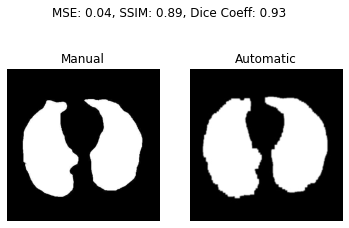

0.9269084408166428


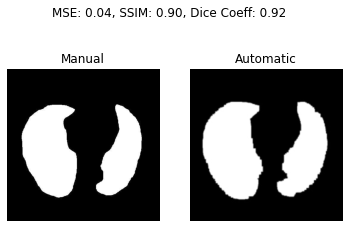

0.9207694191928407


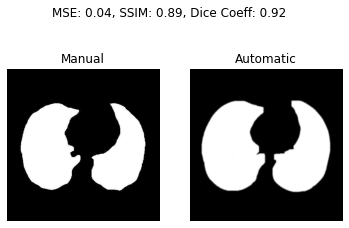

0.9206089213919026


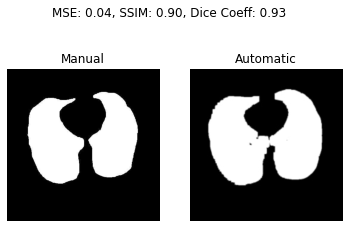

0.9262461226428673


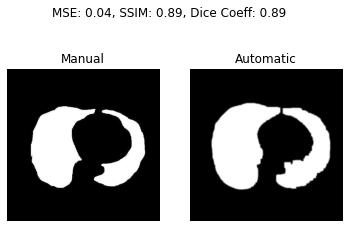

0.885763723430574


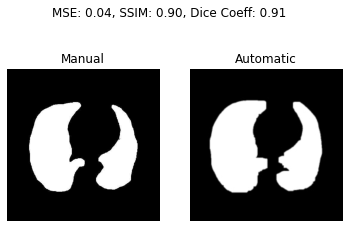

0.9090844802782503


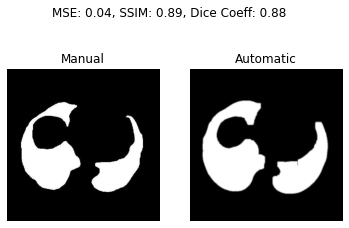

0.8808080426053482


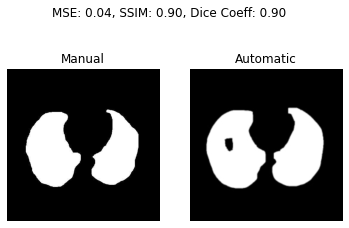

0.8965684472064975


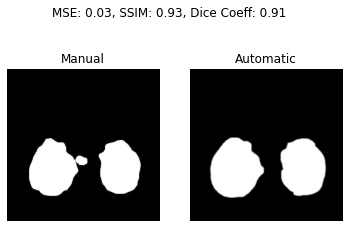

0.9096207240124885


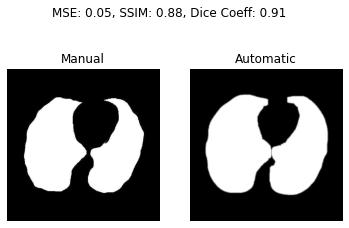

0.9133725946275366


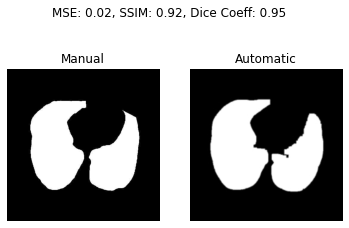

0.9451430955471992


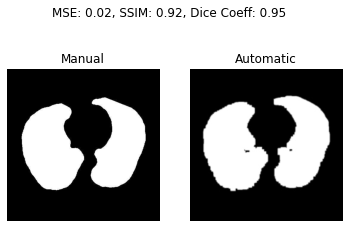

0.9488179999366365


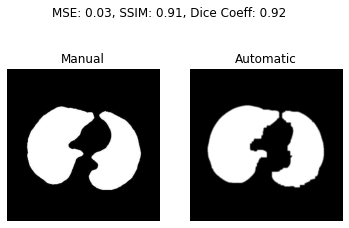

0.924486926041585


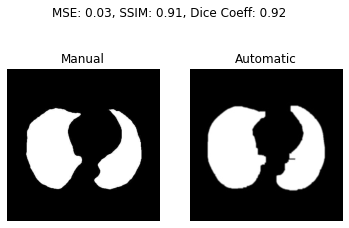

0.9216452204392899


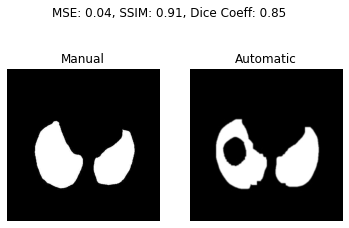

0.845618367393705


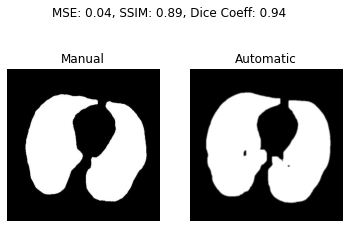

0.9411489647752728


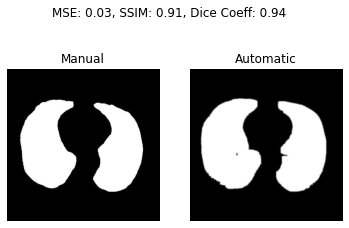

0.9406761456028061


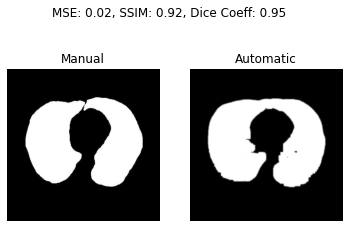

0.9484006608793918


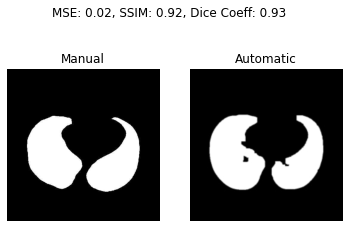

0.9275543261951784


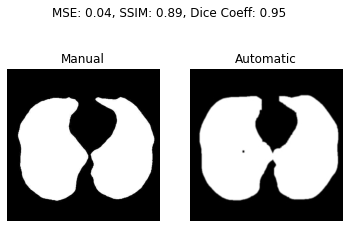

0.9479930278480875


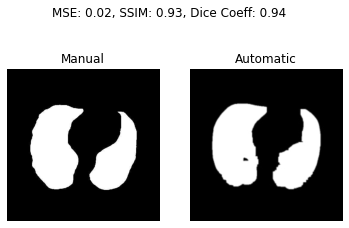

0.9379244299496248


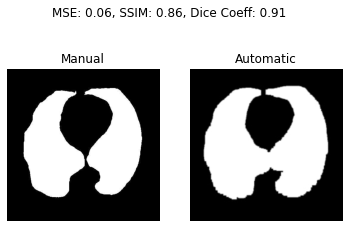

0.9108262269730821


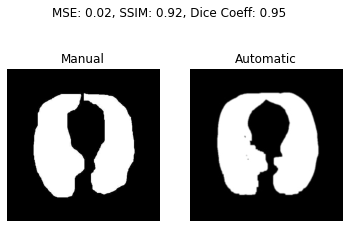

0.9478206157096354


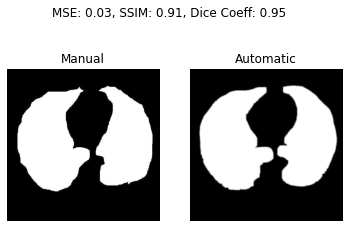

0.9544491003172285


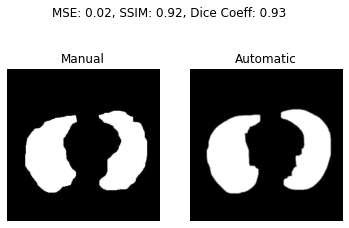

0.9324959306034576


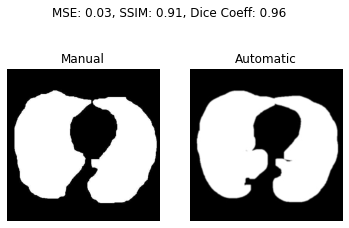

0.9608559539746336


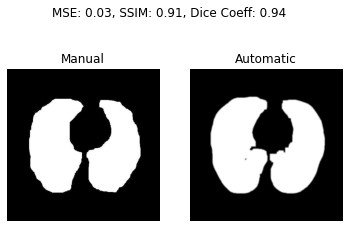

0.9430937983680148


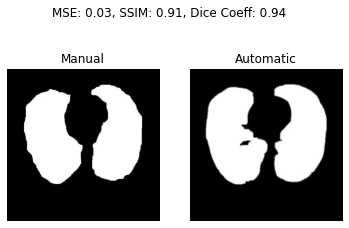

0.9438727086134668


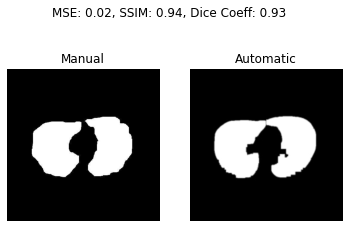

0.929139123449797


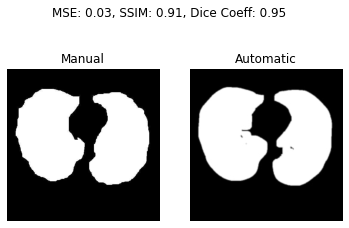

0.9539164855357631


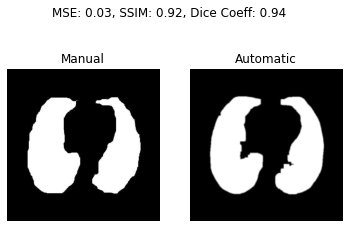

0.9388904856830246


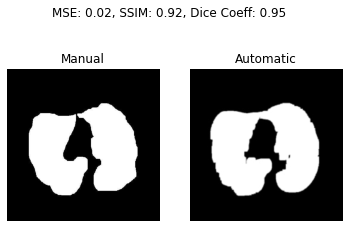

0.946399625737284


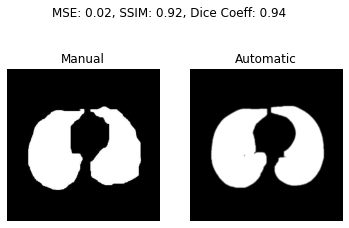

0.9426938967636463


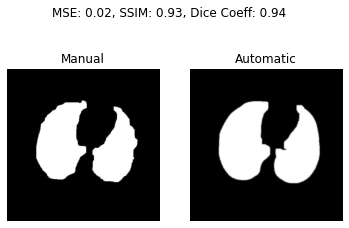

0.9435708271878575


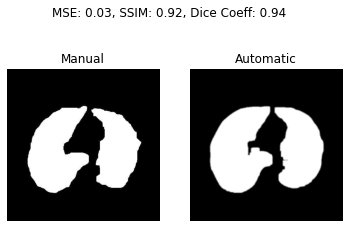

0.939579690484072
*********** Automatic and Second Set of Manual*************


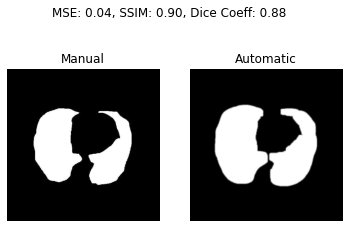

0.8803096510479935


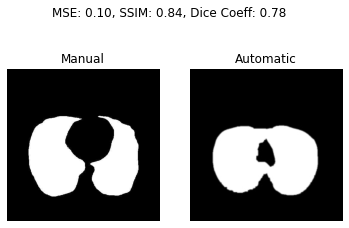

0.7762981154199269


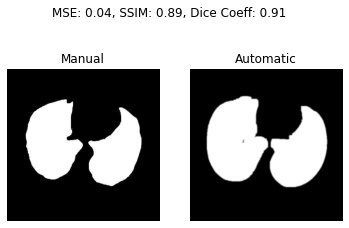

0.9068765720858274


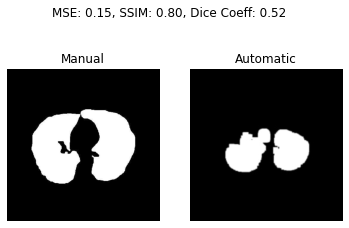

0.5169384867743098


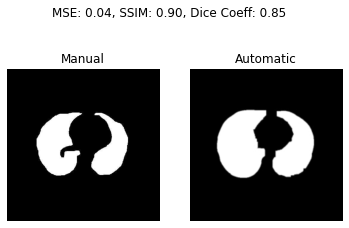

0.8478411345904577


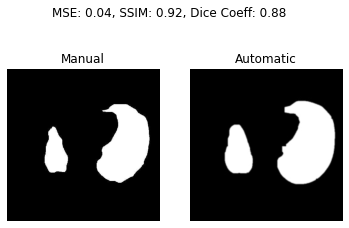

0.8814314826432798


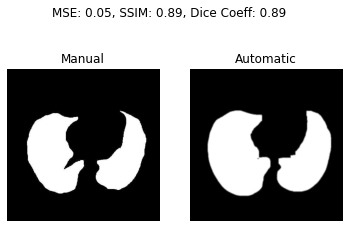

0.8900204862641145


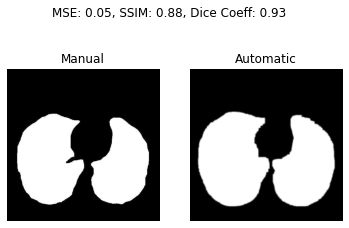

0.9275723061339435


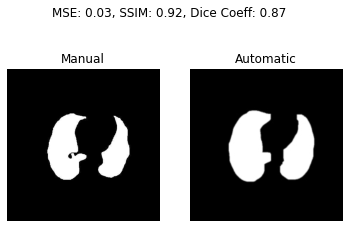

0.8683846010736228


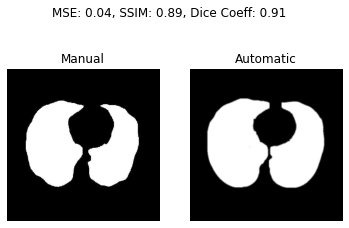

0.9145572099919149


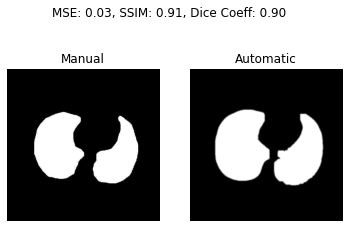

0.901678870966179


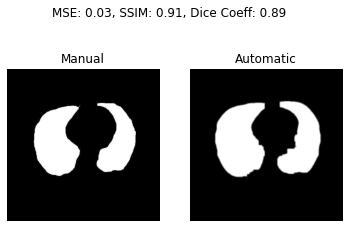

0.8905950728433348


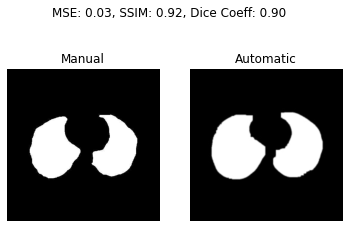

0.900747257577823


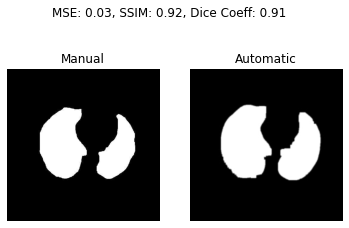

0.9057719839011302


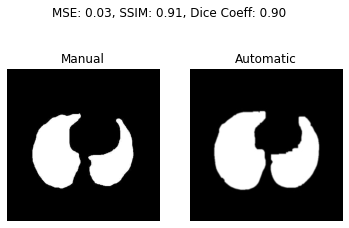

0.8977830824977873


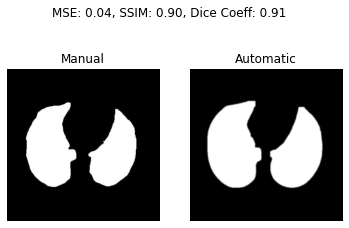

0.9106992346865235


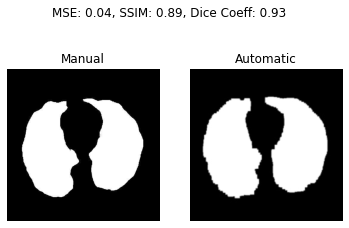

0.9310998156733321


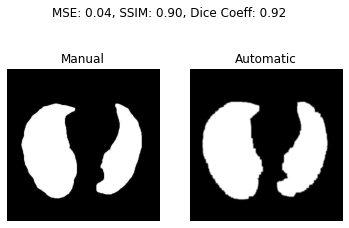

0.92188171167933


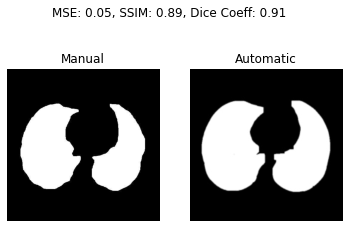

0.9100659341365357


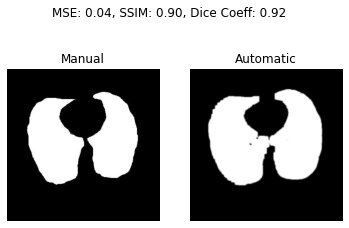

0.9214330332425861


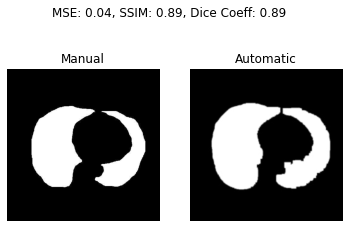

0.8867123362112496


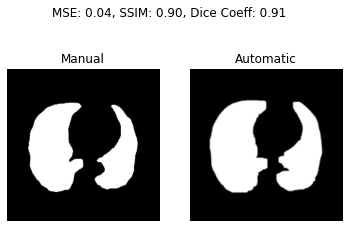

0.9114165528490148


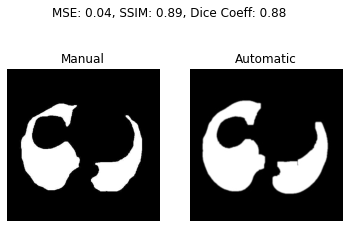

0.8809978867708553


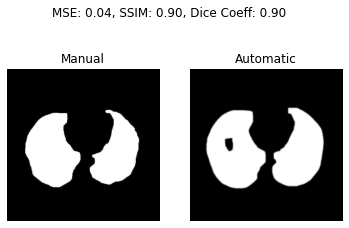

0.8994070912205785


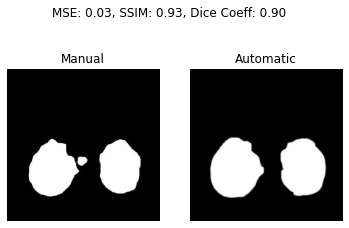

0.9046484192913167


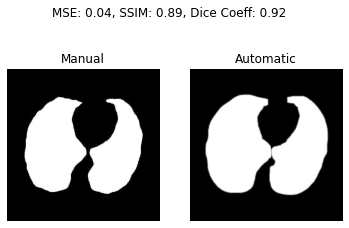

0.9228667121820616


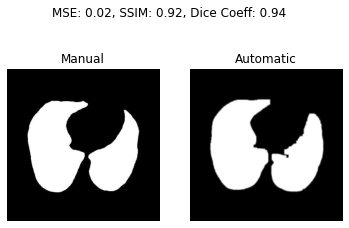

0.943878340599152


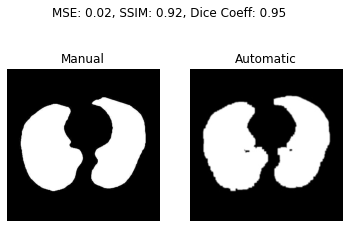

0.9519093385643633


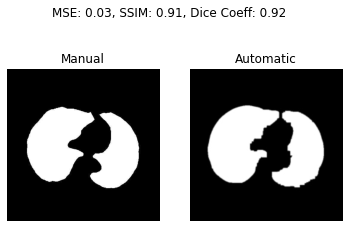

0.9216255161915412


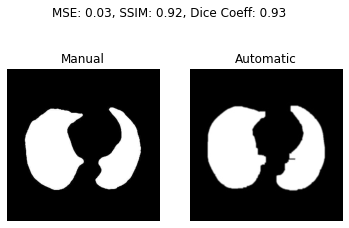

0.9303825699850634


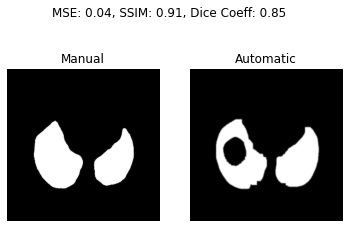

0.8468733472316671


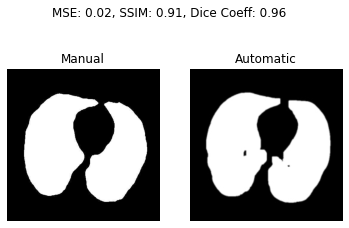

0.9578949383729727


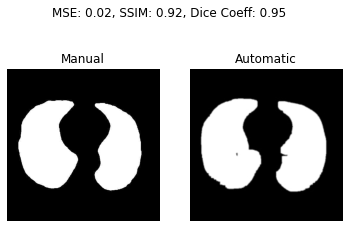

0.9490742473695423


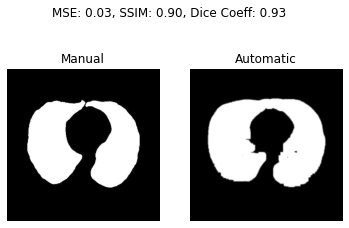

0.926748422854192


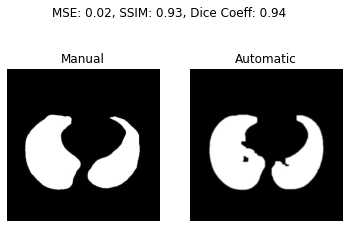

0.9411256622488451


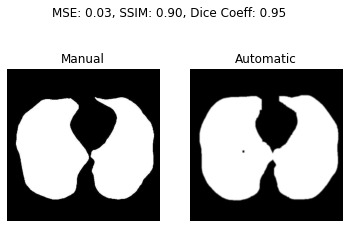

0.9536875116753899


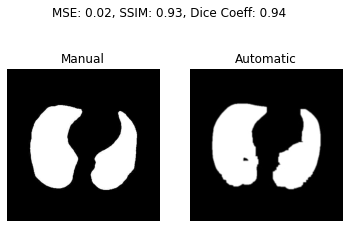

0.9412486154732235


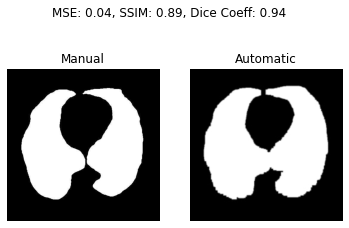

0.9368857521545296


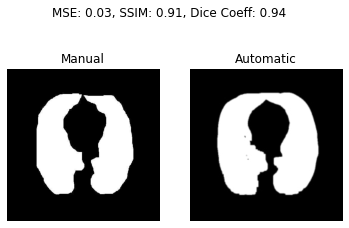

0.938260775115428


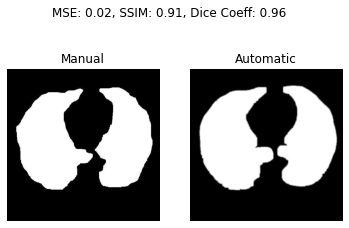

0.9574532919614138


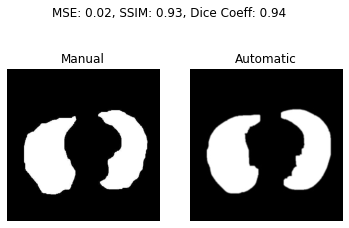

0.9383300043729564


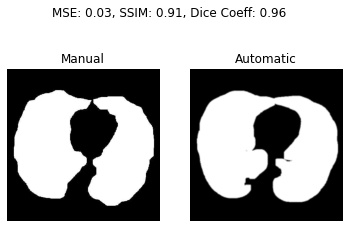

0.9611509640315399


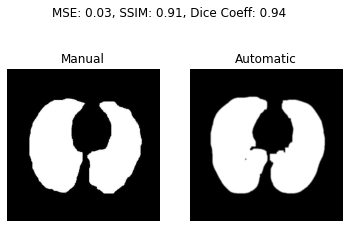

0.942119639650803


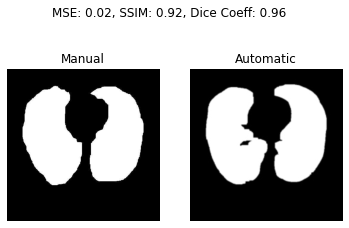

0.955585544072489


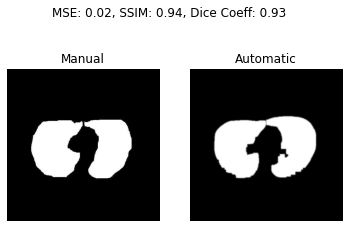

0.9260026346594883


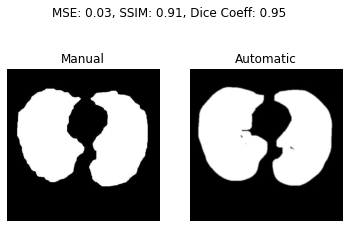

0.9524554473957985


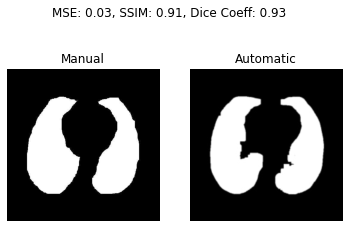

0.9306483590196364


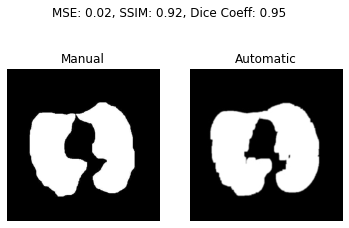

0.9450491996700614


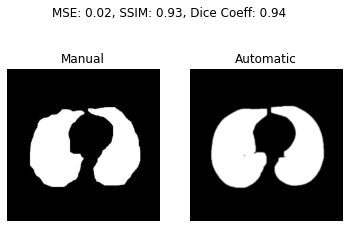

0.9448770974828771


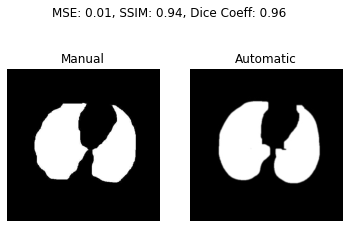

0.9560501120798003


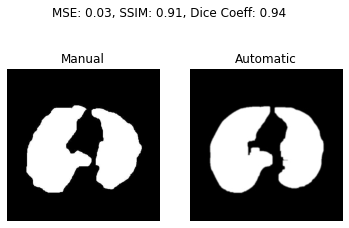

0.9366012977803195


,Image Name,Mean Square Error,Structural Similarity Measure,Dice Correlation Coefficient
0,LIDC-IDRI-0001.jpg,0.038279,0.902854,0.890853
1,LIDC-IDRI-0005.jpg,0.105817,0.838501,0.770018
2,LIDC-IDRI-0006.jpg,0.041435,0.896846,0.912121
3,LIDC-IDRI-0007.jpg,0.147121,0.800886,0.516461
4,LIDC-IDRI-0008.jpg,0.039725,0.906944,0.855213
5,LIDC-IDRI-0016.jpg,0.034733,0.917220,0.883379
6,LIDC-IDRI-0018.jpg,0.044049,0.891913,0.898575
7,LIDC-IDRI-0119.jpg,0.046720,0.882737,0.925890
8,LIDC-IDRI-0153.jpg,0.030486,0.922949,0.869361
9,LIDC-IDRI-0247.jpg,0.048169,0.884608,0.902749


,Image Name,Mean Square Error,Structural Similarity Measure,Dice Correlation Coefficient
0,LIDC-IDRI-0001.jpg,0.042090,0.899254,0.880310
1,LIDC-IDRI-0005.jpg,0.101930,0.842596,0.776298
2,LIDC-IDRI-0006.jpg,0.043981,0.893925,0.906877
3,LIDC-IDRI-0007.jpg,0.146077,0.801268,0.516938
4,LIDC-IDRI-0008.jpg,0.041580,0.904809,0.847841
5,LIDC-IDRI-0016.jpg,0.035289,0.916543,0.881431
6,LIDC-IDRI-0018.jpg,0.047829,0.888213,0.890020
7,LIDC-IDRI-0119.jpg,0.045561,0.883727,0.927572
8,LIDC-IDRI-0153.jpg,0.030629,0.921081,0.868385
9,LIDC-IDRI-0247.jpg,0.042111,0.892108,0.914557


,Image Name,MSE 1,MSE 2,avg,std
0,LIDC-IDRI-0001.jpg,0.038279,0.042090,0.040184,0.002694
1,LIDC-IDRI-0005.jpg,0.105817,0.101930,0.103873,0.002748
2,LIDC-IDRI-0006.jpg,0.041435,0.043981,0.042708,0.001800
3,LIDC-IDRI-0007.jpg,0.147121,0.146077,0.146599,0.000738
4,LIDC-IDRI-0008.jpg,0.039725,0.041580,0.040653,0.001311
5,LIDC-IDRI-0016.jpg,0.034733,0.035289,0.035011,0.000393
6,LIDC-IDRI-0018.jpg,0.044049,0.047829,0.045939,0.002673
7,LIDC-IDRI-0119.jpg,0.046720,0.045561,0.046141,0.000820
8,LIDC-IDRI-0153.jpg,0.030486,0.030629,0.030558,0.000102
9,LIDC-IDRI-0247.jpg,0.048169,0.042111,0.045140,0.004284


mean_mse:  0.03632542099192594
std_mse:  0.0023043458849224844


,Image Name,SSM 1,SSM 2,avg,std
0,LIDC-IDRI-0001.jpg,0.902854,0.899254,0.901054,0.002546
1,LIDC-IDRI-0005.jpg,0.838501,0.842596,0.840549,0.002896
2,LIDC-IDRI-0006.jpg,0.896846,0.893925,0.895386,0.002066
3,LIDC-IDRI-0007.jpg,0.800886,0.801268,0.801077,0.000270
4,LIDC-IDRI-0008.jpg,0.906944,0.904809,0.905877,0.001510
5,LIDC-IDRI-0016.jpg,0.917220,0.916543,0.916881,0.000479
6,LIDC-IDRI-0018.jpg,0.891913,0.888213,0.890063,0.002616
7,LIDC-IDRI-0119.jpg,0.882737,0.883727,0.883232,0.000700
8,LIDC-IDRI-0153.jpg,0.922949,0.921081,0.922015,0.001321
9,LIDC-IDRI-0247.jpg,0.884608,0.892108,0.888358,0.005303


mean_ssm:  0.9049571823245103
std_ssm:  0.0032215651687104298


,Image Name,DCC 1,DCC 2,avg,std
0,LIDC-IDRI-0001.jpg,0.890853,0.880310,0.885581,0.007455
1,LIDC-IDRI-0005.jpg,0.770018,0.776298,0.773158,0.004441
2,LIDC-IDRI-0006.jpg,0.912121,0.906877,0.909499,0.003709
3,LIDC-IDRI-0007.jpg,0.516461,0.516938,0.516700,0.000338
4,LIDC-IDRI-0008.jpg,0.855213,0.847841,0.851527,0.005213
5,LIDC-IDRI-0016.jpg,0.883379,0.881431,0.882405,0.001377
6,LIDC-IDRI-0018.jpg,0.898575,0.890020,0.894298,0.006049
7,LIDC-IDRI-0119.jpg,0.925890,0.927572,0.926731,0.001190
8,LIDC-IDRI-0153.jpg,0.869361,0.868385,0.868873,0.000690
9,LIDC-IDRI-0247.jpg,0.902749,0.914557,0.908653,0.008349


mean_dcc:  0.9087432843640658
std_dcc:  0.003943032732545483
******************************************
First Round of Manual Masks vs Automatic Masks 
Mean
Mean Square Error                0.036927
Structural Similarity Measure    0.904247
Dice Correlation Coefficient     0.907801
dtype: float64
Standard Deviation
Mean Square Error                0.020615
Structural Similarity Measure    0.023038
Dice Correlation Coefficient     0.065442
dtype: float64
Second Round of Manual Masks vs Automatic Masks 
Mean
Mean Square Error                0.035723
Structural Similarity Measure    0.905667
Dice Correlation Coefficient     0.909685
dtype: float64
Standard Deviation
Mean Square Error                0.020362
Structural Similarity Measure    0.022538
Dice Correlation Coefficient     0.065873
dtype: float64


In [48]:
# load the images
automatic_masks_directory = r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Jupyter masks'
manual_masks_directory_1 = r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Manual Segmentation\new Jpeg Masks- round 1'
manual_masks_directory_2 = r'C:\Users\naomi\Desktop\Northpoint\Northpoint-AI\Manual Segmentation\new Jpeg Masks- round 2'


image_names= []
automatic_combined_file_path= []
manual_combined_file_path_1=[]
manual_combined_file_path_2=[]

#list values for automatic jupyter masks vs first round of manual masks
mse_list_1=[]
ssm_list_1=[]
dcc_list_1=[]
#list values for automatic jupyter masks vs second round of manual masks
mse_list_2=[]
ssm_list_2=[]
dcc_list_2=[]
image_comparison_dataframe_1= pd.DataFrame (columns = ['Image Name','Mean Square Error','Structural Similarity Measure','Dice Correlation Coefficient'])
image_comparison_dataframe_2= pd.DataFrame (columns = ['Image Name','Mean Square Error','Structural Similarity Measure','Dice Correlation Coefficient'])

for filename in os.listdir(automatic_masks_directory): #for automatic jupyter masks
    automatic_combined_file_path.append(os.path.join(automatic_masks_directory, filename))
    image_names.append(filename)

for filename in os.listdir(manual_masks_directory_1): #for manual masks masks
    manual_combined_file_path_1.append(os.path.join(manual_masks_directory_1, filename))

for filename in os.listdir(manual_masks_directory_2): #for manual masks masks
    manual_combined_file_path_2.append(os.path.join(manual_masks_directory_2, filename))

print("*********** Automatic and First Set of Manual*************")
for x in range(51):
    auto_mask= cv2.imread(automatic_combined_file_path[x],0)
    manual_mask= cv2.imread(manual_combined_file_path_1[x],0)
    auto_mask = resize(auto_mask, (512, 512))
    manual_mask = resize(manual_mask, (512, 512))
    mse_value,ssm_value,dcc_value= compare_images(manual_mask,auto_mask)
    mse_list_1.append(mse_value)
    ssm_list_1.append(ssm_value)
    dcc_list_1.append(dcc_value)

print("*********** Automatic and Second Set of Manual*************")
for x in range(51):
    auto_mask= cv2.imread(automatic_combined_file_path[x],0)
    manual_mask= cv2.imread(manual_combined_file_path_2[x],0)
    auto_mask = resize(auto_mask, (512, 512))
    manual_mask = resize(manual_mask, (512, 512))
    mse_value,ssm_value,dcc_value= compare_images(manual_mask,auto_mask)
    mse_list_2.append(mse_value)
    ssm_list_2.append(ssm_value)
    dcc_list_2.append(dcc_value)
    
#create dataframes 
image_comparison_dataframe_1['Image Name']= image_names
image_comparison_dataframe_1['Mean Square Error']=mse_list_1
image_comparison_dataframe_1['Structural Similarity Measure']= ssm_list_1
image_comparison_dataframe_1['Dice Correlation Coefficient']= dcc_list_1
dataframe=image_comparison_dataframe_1.style.set_caption('First Round of Manual Masks vs Automatic Masks')
display(dataframe)

image_comparison_dataframe_2['Image Name']= image_names
image_comparison_dataframe_2['Mean Square Error']=mse_list_2
image_comparison_dataframe_2['Structural Similarity Measure']= ssm_list_2
image_comparison_dataframe_2['Dice Correlation Coefficient']= dcc_list_2
dataframe=image_comparison_dataframe_2.style.set_caption('Second Round of Manual Masks vs Automatic Masks ')
display(dataframe)

mse_dataframe= pd.DataFrame (columns = ['Image Name', 'MSE 1', 'MSE 2'])
ssm_dataframe= pd.DataFrame (columns = ['Image Name', 'SSM 1', 'SSM 2'])
dcc_dataframe= pd.DataFrame (columns = ['Image Name', 'DCC 1', 'DCC 2'])

mse_dataframe['Image Name']= image_names
mse_dataframe['MSE 1']= mse_list_1
mse_dataframe['MSE 2']= mse_list_2
mse_dataframe['avg'] = mse_dataframe[['MSE 1', 'MSE 2']].mean(axis=1)
mse_dataframe['std'] = mse_dataframe[['MSE 1', 'MSE 2']].std(axis=1)
display(mse_dataframe)
mean_mse= mse_dataframe['avg'].mean()
print("mean_mse: " , mean_mse)
std_mse= mse_dataframe['std'].std()
print("std_mse: " , std_mse)

ssm_dataframe['Image Name']= image_names
ssm_dataframe['SSM 1']= ssm_list_1
ssm_dataframe['SSM 2']= ssm_list_2
ssm_dataframe['avg'] = ssm_dataframe[['SSM 1', 'SSM 2']].mean(axis=1)
ssm_dataframe['std'] = ssm_dataframe[['SSM 1', 'SSM 2']].std(axis=1)
display(ssm_dataframe)
mean_ssm= ssm_dataframe['avg'].mean()
print("mean_ssm: " , mean_ssm)
std_ssm= ssm_dataframe['std'].std()
print("std_ssm: " , std_ssm)

dcc_dataframe['Image Name']= image_names
dcc_dataframe['DCC 1']= dcc_list_1
dcc_dataframe['DCC 2']= dcc_list_2
dcc_dataframe['avg'] = dcc_dataframe[['DCC 1', 'DCC 2']].mean(axis=1)
dcc_dataframe['std'] = dcc_dataframe[['DCC 1', 'DCC 2']].std(axis=1)
display(dcc_dataframe)
mean_dcc= dcc_dataframe['avg'].mean()
print("mean_dcc: " , mean_dcc)
std_dcc= dcc_dataframe['std'].std()
print("std_dcc: " , std_dcc)

print ("******************************************")
print("First Round of Manual Masks vs Automatic Masks ")
print("Mean")
mean1=image_comparison_dataframe_1.mean(axis = 0)
print(mean1)
print("Standard Deviation")
std1=image_comparison_dataframe_1.std(axis = 0)
print(std1)

print("Second Round of Manual Masks vs Automatic Masks ")
print("Mean")
mean2=image_comparison_dataframe_2.mean(axis = 0)
print(mean2)
print("Standard Deviation")
std2=image_comparison_dataframe_2.std(axis = 0)
print(std2)
